# Body Pose Analysis
* pose_arr - raw 3D body pose data
* clean_poses - camera-view invariant 3d body poses
* poses_features - 3D body poses in feature space

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import math
import cv2

In [2]:
def importImage(img):
    #Import image
    image = cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2RGB)
    return image

In [3]:
def cleanPenDataFrames(pose_3d_df, pose_3d_2_df):
    #pose_3d_3_df: 17 - 19 data
    #pose_3d_df: 19 - 21 data
    #Change shots that hit post to 'Off T'
    pose_3d_2_df.loc[pose_3d_2_df.shot_outcome_name == 'Post', 'shot_outcome_name'] = 'Off T'
    pose_3d_2_df.drop(columns=['match_id','minute','team_id','team_name','player_id','shot_body_part_name',
                     'shot_technique_name','date','home_team','away_team','season',
                     'competition','gk_id'], inplace=True)
    pose_3d_df.loc[pose_3d_df.off_target == 1, 'outcome'] = 'Off T'
    pose_3d_df.loc[pose_3d_df.outcome == 'Scored', 'outcome'] = 'Goal'
    pose_3d_df.loc[pose_3d_df.outcome == 'Missed', 'outcome'] = 'Saved'
    pose_3d_df.drop(columns=['url','off_target'], inplace=True)
    reorder = ['pen_taker','outcome','goalkeepers'] + list(map(str, list(range(int(pose_3d_df.columns[-1]) + 1))))
    pose_3d_df = pose_3d_df[reorder]
    pose_3d_2_df.rename(columns={"player_name": "pen_taker", 
                                 "shot_outcome_name": "outcome",
                                 "gk_name": "goalkeepers"}, inplace=True)
    joined_pose_3d_df = pose_3d_2_df.append(pose_3d_df, ignore_index=True) #contains all pens
    joined_pose_3d_df.dropna(inplace=True)
    pose_arr = joined_pose_3d_df.loc[:,'0':].values
    return (joined_pose_3d_df, pose_arr)

## Import data 

In [4]:
#3D pose data - 2019/20 and 2020/21
pose_3d_df = pd.read_csv('../PenaltyData/poseData/pose_3d_19_20_20_21.csv', index_col=0)
pose_3d_2_df = pd.read_csv('../PenaltyData/poseData/pose_3d_17_18_18_19.csv', index_col=0)
joined_pose_3d_df, pose_arr = cleanPenDataFrames(pose_3d_df, pose_3d_2_df)
#pose_arr_1 = pose_3d_df.loc[:,'0':].values
#pose_arr_2 = pose_3d_2_df.loc[:,'0':].values
#pose_arr = np.concatenate((pose_arr_1, pose_arr_2), axis=0)

In [5]:
#2D pose data
pose_2d_df = pd.read_csv('../PenaltyData/poseData/pose_2d_19_20_20_21.csv', index_col=0)
pose_2d_2_df = pd.read_csv('../PenaltyData/poseData/pose_2d_17_18_18_19.csv', index_col=0)
joined_pose_2d_df, pose_2d_arr = cleanPenDataFrames(pose_2d_df, pose_2d_2_df)

In [6]:
def getImageID(pose_df, array_id):
    #Input: pose_df - dataframe with raw pose information - index matches to photo name
    #Input: array_id - location of pose in array
    #Returns: photo name/id
    return np.array(pose_df.index)[array_id]

In [7]:
getImageID(joined_pose_3d_df, 3)

4

In [8]:
def getArrayID(pose_df, photo_id):
    return np.where(np.array(pose_df.index) == photo_id)[0][0]

In [9]:
getArrayID(joined_pose_3d_df, 315)

284

## Visualise Body Pose

In [10]:
def pose_to_matrix(pose):
    if len(pose) == 48:
        pose_matrix = pose.reshape(16, 3)
    else:
        pose_matrix = pose.reshape(16, 2)
    return pose_matrix

In [11]:
#2D plot of the 3D body pose in the x-y plane (ignoring z-axis)
def poseViz2D(ax, pose_3d):
    #pose_3d = pose_to_matrix(pose_matrix)
    #fig, ax = plt.subplots()
    for e in range(len(mpii_edges)):
        ax.plot(pose_3d[mpii_edges[e]][:, 0], -1*pose_3d[mpii_edges[e]][:, 1])

    ax.set_xlabel('x')
    ax.set_ylabel('y')
    #plt.show()

In [12]:
def plot3D(ax, points, s=100, show_grid=False):
    ax.grid(show_grid)
    oo = 1e10
    xmax,ymax,zmax = -oo,-oo,-oo
    xmin,ymin,zmin = oo, oo, oo
    edges = mpii_edges
    c='b'
    marker = 'o'
    points = points.reshape(-1, 3)
    x, y, z = np.zeros((3, points.shape[0]))
    for j in range(points.shape[0]):
        x[j] = points[j, 0].copy()
        y[j] = points[j, 2].copy()
        z[j] = -points[j, 1].copy()
        xmax = max(x[j], xmax)
        ymax = max(y[j], ymax)
        zmax = max(z[j], zmax)
        xmin = min(x[j], xmin)
        ymin = min(y[j], ymin)
        zmin = min(z[j], zmin)
    ax.scatter(x, y, z, s = s, c = c, marker = marker)
    for e in edges:
        ax.plot(x[e], y[e], z[e], c = c)
    max_range = np.array([xmax-xmin, ymax-ymin, zmax-zmin]).max()
    Xb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][0].flatten() + 0.5*(xmax+xmin)
    Yb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][1].flatten() + 0.5*(ymax+ymin)
    Zb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][2].flatten() + 0.5*(zmax+zmin)
    for xb, yb, zb in zip(Xb, Yb, Zb):
        ax.plot([xb], [yb], [zb], 'w')

In [13]:
mpii_edges = [[0, 1], [1, 2], [2, 6], [6, 3], [3, 4], [4, 5], 
              [10, 11], [11, 12], [12, 8], [8, 13], [13, 14], [14, 15], 
              [6, 8], [8, 9]]

Photo ID: 156


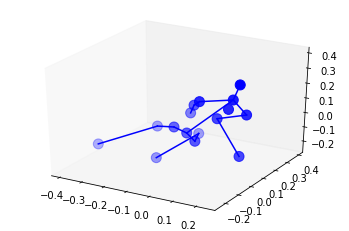

In [22]:
points = pose_to_matrix(pose_arr[132])
fig = plt.figure()
ax = fig.add_subplot((111),projection='3d')
plot3D(ax, points)
print("Photo ID:", getImageID(joined_pose_3d_df, 132))
plt.show()

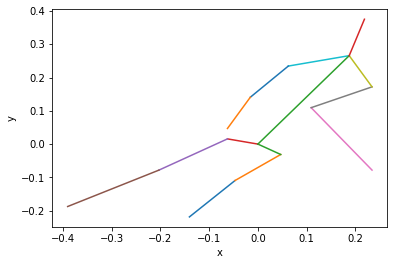

In [23]:
fig,ax = plt.subplots()
poseViz2D(ax, pose_to_matrix(pose_arr[132]))
plt.show()

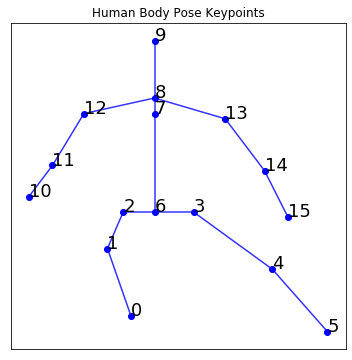

In [21]:
#Viz to show keypoint locations
pose_3d = pose_to_matrix(pose_arr[159])
fig, ax = plt.subplots(figsize=(6, 6))
for e in range(len(mpii_edges)):
    ax.plot(pose_3d[mpii_edges[e]][:, 0], -pose_3d[mpii_edges[e]][:, 1], c='b', alpha=0.8)
for keypoint in range(len(pose_3d)):
    ax.scatter(pose_3d[keypoint][:2][0], -pose_3d[keypoint][:2][1], c='b')
    ax.annotate(str(keypoint), (pose_3d[keypoint][:2][0], -pose_3d[keypoint][:2][1]), fontsize=18)
ax.set_yticks([])
ax.set_xticks([])
plt.title('Human Body Pose Keypoints')
#plt.savefig('viz/keypoints.png', dpi=400)
plt.show()

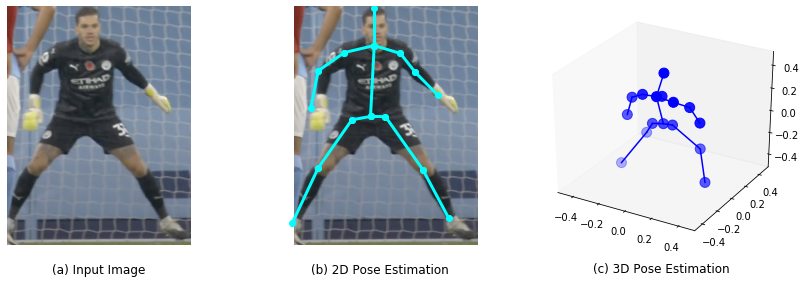

In [46]:
#Human Body Pose Estimation Example
#Show image, image with 2D pose overlay, and 3D pose estimate
photo_id = 315
array_id = getArrayID(joined_pose_3d_df, photo_id)
image = importImage('../PenaltyData/combined_data/' + str(photo_id)+'.png')
pose_2d = pose_to_matrix(pose_2d_arr[array_id])
points = pose_to_matrix(pose_arr[array_id])

fig = plt.figure(figsize=(12, 4))
#fig.patch.set_visible(False)
ax = fig.add_subplot(1, 3, 1)
ax.imshow(image)
ax.set_yticks([])
ax.set_xticks([])
ax.axis('off')
ax.set_title('(a) Input Image', y=-0.14)

ax = fig.add_subplot(1, 3, 2)
ax.imshow(image)
for e in range(len(mpii_edges)):
    ax.plot(pose_2d[mpii_edges[e]][:, 0], pose_2d[mpii_edges[e]][:, 1], c='cyan', lw=3, marker='o')
ax.set_yticks([])
ax.set_xticks([])
ax.axis('off')
ax.set_title('(b) 2D Pose Estimation', y=-0.14)
    
ax = fig.add_subplot(1, 3, 3, projection='3d')
plot3D(ax, points)
ax.set_title('(c) 3D Pose Estimation', y=-0.15)
plt.tight_layout()
#plt.savefig('viz/poseEstimationExample.png', dpi=500)
plt.show()

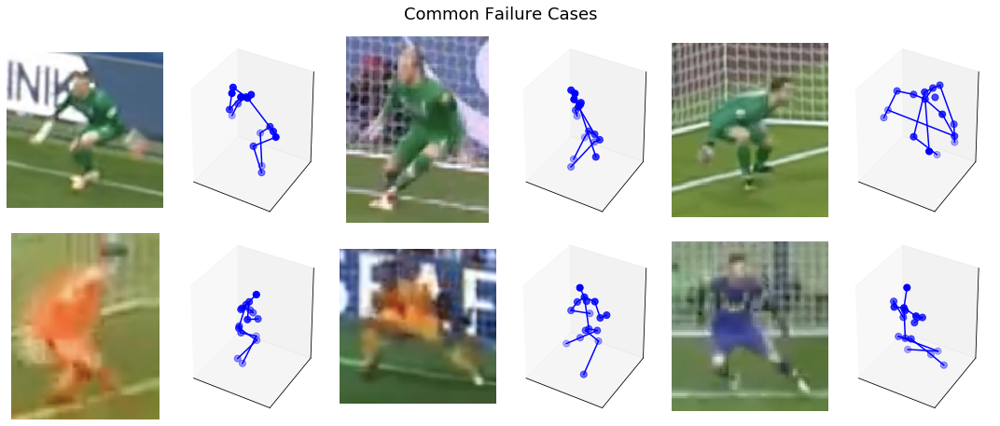

In [27]:
#Common Failure Cases
path = '../PenaltyData/combined_data/'
pic_ids = [260, 31, 240]
fig = plt.figure(figsize=(15, 6))

ax = fig.add_subplot(2, 6, 1)
ax.imshow(importImage(path + str(pic_ids[0]) + '.png'))
ax.set_yticks([])
ax.set_xticks([])
ax.axis('off')
ax = fig.add_subplot(2, 6, 2, projection='3d')
plot3D(ax, pose_to_matrix(pose_arr[getArrayID(joined_pose_3d_df, pic_ids[0])]), s=50)
ax.set_yticks([])
ax.set_xticks([])
ax.set_zticks([])

ax = fig.add_subplot(2, 6, 3)
ax.imshow(importImage(path + str(pic_ids[1]) + '.png'))
ax.set_yticks([])
ax.set_xticks([])
ax.axis('off')
ax = fig.add_subplot(2, 6, 4, projection='3d')
plot3D(ax, pose_to_matrix(pose_arr[getArrayID(joined_pose_3d_df, pic_ids[1])]), s=50)
ax.set_yticks([])
ax.set_xticks([])
ax.set_zticks([])

ax = fig.add_subplot(2, 6, 5)
ax.imshow(importImage(path + str(pic_ids[2]) + '.png'))
ax.set_yticks([])
ax.set_xticks([])
ax.axis('off')
ax = fig.add_subplot(2, 6, 6, projection='3d')
plot3D(ax, pose_to_matrix(pose_arr[getArrayID(joined_pose_3d_df,pic_ids[2])]), s=50)
ax.set_yticks([])
ax.set_xticks([])
ax.set_zticks([])

pic_ids = [40, 62, 65]

ax = fig.add_subplot(2, 6, 7)
ax.imshow(importImage(path + str(pic_ids[0]) + '.png'))
ax.set_yticks([])
ax.set_xticks([])
ax.axis('off')
ax = fig.add_subplot(2, 6, 8, projection='3d')
plot3D(ax, pose_to_matrix(pose_arr[getArrayID(joined_pose_3d_df, pic_ids[0])]), s=50)
ax.set_yticks([])
ax.set_xticks([])
ax.set_zticks([])

ax = fig.add_subplot(2, 6, 9)
ax.imshow(importImage(path + str(pic_ids[1]) + '.png'))
ax.set_yticks([])
ax.set_xticks([])
ax.axis('off')
ax = fig.add_subplot(2, 6, 10, projection='3d')
plot3D(ax, pose_to_matrix(pose_arr[getArrayID(joined_pose_3d_df, pic_ids[1])]), s=50)
ax.set_yticks([])
ax.set_xticks([])
ax.set_zticks([])

ax = fig.add_subplot(2, 6, 11)
ax.imshow(importImage(path + str(pic_ids[2]) + '.png'))
ax.set_yticks([])
ax.set_xticks([])
ax.axis('off')
ax = fig.add_subplot(2, 6, 12, projection='3d')
plot3D(ax, pose_to_matrix(pose_arr[getArrayID(joined_pose_3d_df,pic_ids[2])]), s=50)
ax.set_yticks([])
ax.set_xticks([])
ax.set_zticks([])

plt.suptitle('Common Failure Cases', y=1.05, fontsize=18)
plt.tight_layout()
plt.savefig('viz/failurecases.png', dpi=500, bbox_inches='tight')
plt.show()

## Data Cleaning / Feature Extraction
### Rotate 3D Body Pose
* Find rotation in y axis of 3D body pose such that the range of the 2D projection in the x-coordinate direction is maximised
* Could experiment with rotation about the x to normalise for camera height, but this appears to have minimal effect.

In [14]:
def rotatePose(pose_3d, theta):
    #Rotate body pose by theta degrees around the y axis
    #Input: pose_3d - 16x3 array representing the coordinates of the body pose
    #Returns: 16x3 array of rotated body pose coordinates
    radian = math.radians(theta)

    rotation_matrix = np.array([[np.cos(radian), 0, np.sin(radian)],
                                [0, 1, 0],
                                [-np.sin(radian), 0, np.cos(radian)]])

    rotated_pose = np.zeros((len(pose_3d), 3))
    for i in range(len(pose_3d)):
        rotated_pose[i] = rotation_matrix @ pose_3d[i]
    return rotated_pose

In [15]:
def hipWidth(pose_3d):
    #Input: pose_3d - 16x3 np array representing a single 3D body pose
    #Returns euclidean distance in x-y space of the two hip joints
    #Indices of both hip locations are 2 and 3.
    return np.linalg.norm(pose_3d[3][:2]-pose_3d[2][:2])

In [16]:
def cameraInvariantPose(pose_3d):
    # Function to get the optimal rotated pose
    best_pose = pose_3d
    max_hip_width = hipWidth(pose_3d)
    theta_ranges = list(range(10, 100, 10)) + list(range(270, 360, 10))

    for theta in theta_ranges:
        rotated_pose = rotatePose(pose_3d, theta=theta)
        hip_width = hipWidth(rotated_pose)
        if hip_width > max_hip_width:
            best_pose = rotated_pose
            max_hip_width = hip_width
    return best_pose

In [17]:
def cameraInvariantDataset(raw_poses):
    #Converts the raw body point dataset to a cleaned camera-invariant one
    cleaned_pose_arr = raw_poses.copy()
    for i in range(len(raw_poses)):
        pose_3d = pose_to_matrix(raw_poses[i])
        best_pose = cameraInvariantPose(pose_3d)
        cleaned_pose_arr[i] = best_pose.flatten()
    return cleaned_pose_arr

In [18]:
#Get camera-view invariant dataset of 3d poses
clean_poses = cameraInvariantDataset(pose_arr)

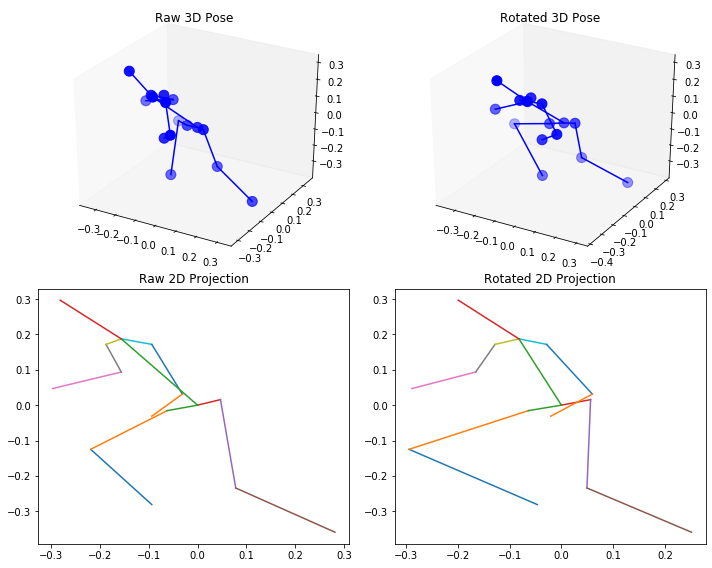

In [114]:
#Camera-view invariance example
pose_id = 140
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(2, 2, 1, projection='3d')
plot3D(ax, pose_to_matrix(pose_arr[pose_id]))
ax.set_title('Raw 3D Pose')
ax = fig.add_subplot(2, 2, 2, projection='3d')
plot3D(ax, pose_to_matrix(clean_poses[pose_id]))
ax.set_title('Rotated 3D Pose')
ax = fig.add_subplot(2, 2, 3)
poseViz2D(ax, pose_to_matrix(pose_arr[pose_id]))
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Raw 2D Projection')
ax = fig.add_subplot(2, 2, 4)
poseViz2D(ax, pose_to_matrix(clean_poses[pose_id]))
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_title('Rotated 2D Projection')
plt.tight_layout()
plt.savefig('viz/camera_invariance.png', dpi=500)
plt.show()

### Extract Features From Body Pose
* Distance of Forward Step - Absolute value of difference in z-coordinate of two feet (effectively the difference in depth between both feet)
* Body Angle - angle made by 2d vector given by the 7th index keypoint
* Distance of arms from torso
* Leg Span
* Body Height - |max(y) - min(y)|

In [19]:
def torsoAngle(pose_3d):
    #Torso Angle
    torso_angle = math.atan2(pose_3d[7][0], -pose_3d[7][1])*180/math.pi
    return torso_angle

In [20]:
def bodyHeight(pose_3d):
    #Body Height
    height = np.abs(np.max(-pose_3d[:, 1]) - np.min(-pose_3d[:, 1]))
    return height

In [21]:
def forwardStep(pose_3d):
    #Distance of forward step
    forward_step = np.abs(pose_3d[0][2] - pose_3d[5][2])
    return forward_step

In [22]:
def handHeight(pose_3d):
    hand_height = np.abs(np.min(-pose_3d[:, 1]) - np.min(-pose_3d[[10, 15]][:, 1]))
    return hand_height

In [23]:
def bodyAngle(pose_3d):
    midpoint = (pose_3d[0][:2] + pose_3d[5][:2])/2
    midpoint[1] *= -1
    torso = pose_3d[7][:2] * np.array([1, -1])
    body_angle_vec = torso-midpoint
    return math.atan2(body_angle_vec[0], body_angle_vec[1])*180/math.pi

In [24]:
def PosesFeatureSpace(clean_poses):
    #Input: clean_poses - dataset off all of the camera-invariant poses
    #Returns: dataset of poses in feature space
    pose_features = np.zeros((len(clean_poses), 5))
    for i in range(len(clean_poses)):
        pose_3d = pose_to_matrix(clean_poses[i])
        feature_array = np.array([torsoAngle(pose_3d), bodyHeight(pose_3d), 
                                  forwardStep(pose_3d), handHeight(pose_3d),
                                  bodyAngle(pose_3d)])
        pose_features[i] = feature_array
    return pose_features

In [25]:
pose_3d = pose_to_matrix(clean_poses[205])
pose_3d

array([[ 0.30859683,  0.4375    , -0.15299461],
       [ 0.23623614,  0.25      ,  0.190423  ],
       [ 0.06946262, -0.015625  , -0.00468721],
       [-0.07143002,  0.        ,  0.00127957],
       [-0.13979611,  0.171875  ,  0.35161603],
       [-0.18219289,  0.453125  ,  0.09068265],
       [ 0.        ,  0.        ,  0.        ],
       [-0.11785664, -0.25      ,  0.10836632],
       [-0.1124617 , -0.265625  ,  0.14896062],
       [-0.21448478, -0.390625  ,  0.22225146],
       [ 0.1618426 , -0.015625  ,  0.12406961],
       [ 0.13007719, -0.140625  ,  0.06905031],
       [-0.01575705, -0.265625  ,  0.12895799],
       [-0.21431653, -0.25      ,  0.16004288],
       [-0.18650569, -0.15625   ,  0.17696267],
       [-0.13554542,  0.015625  ,  0.26522845]])

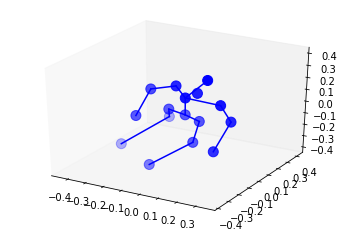

Torso Angle: 24.184967654103637
Vertical Height: 0.78125
Forward Step: 0.16207745040148103
Hand Height: 0.25
Body Angle: 29.651849813857496


In [24]:
#fig, ax = plt.subplots()
fig = plt.figure()
ax = fig.add_subplot((111),projection='3d')
plot3D(ax, pose_3d)
plt.show()
print('Torso Angle:', torsoAngle(pose_3d))
print('Vertical Height:', bodyHeight(pose_3d))
print('Forward Step:', forwardStep(pose_3d))
print('Hand Height:', handHeight(pose_3d))
print('Body Angle:', bodyAngle(pose_3d))

In [25]:
#Computes dataset containing all of the camera-invariant poses in feature space
#Angle, Body Height, Forward Step
poses_features = PosesFeatureSpace(clean_poses)
#Normalise features (change if any features include negative values)
#poses_features = poses_features / poses_features.max(axis=0)

### EDA - Pose Features

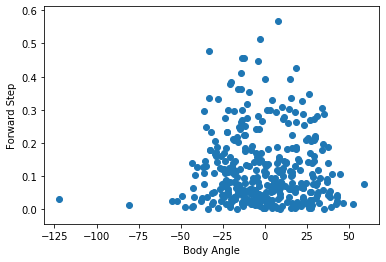

In [28]:
#Forward Step against Body Angle
plt.scatter(poses_features[:,4], poses_features[:, 2])
plt.xlabel('Body Angle')
plt.ylabel('Forward Step')
#plt.savefig('viz/angle_fstep.png', dpi=500)
plt.show()

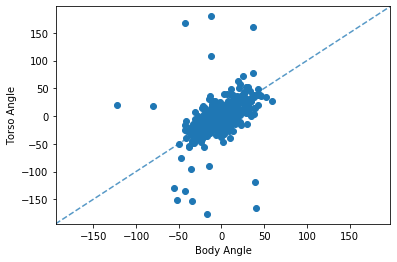

In [35]:
#Check for correlation in body angle vs torso angle
fig, ax = plt.subplots()
ax.scatter(poses_features[:,4], poses_features[:, 0])
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
# now plot both limits against eachother
ax.plot(lims, lims, '--', alpha=0.75, zorder=0)
ax.set_xlim(lims)
ax.set_ylim(lims)
plt.xlabel('Body Angle')
plt.ylabel('Torso Angle')
plt.savefig('viz/angle_correlation.png', dpi=500)
plt.show()

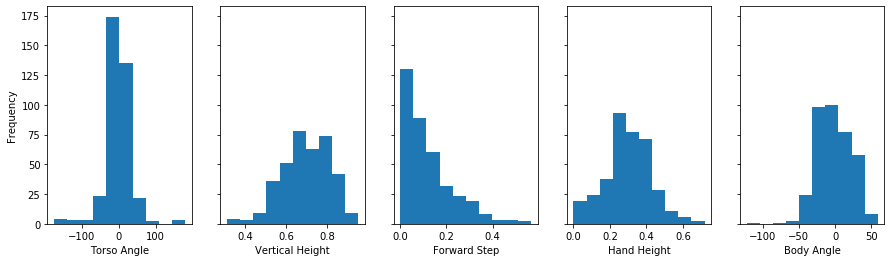

In [48]:
#Histograms of all self-created pose features
num_hist = poses_features.shape[1]
xlabs = ['Torso Angle', 'Vertical Height', 'Forward Step', 'Hand Height', 'Body Angle']
#Show histogram of all self-created body pose features
fig, ax = plt.subplots(nrows=1, ncols=num_hist, figsize=(15, 4), sharey=True)
for i in range(num_hist):
    ax[i].hist(poses_features[:, i])
    ax[i].set_xlabel(xlabs[i])
ax[0].set_ylabel('Frequency')
plt.savefig('viz/feature_hists.png', dpi=500)
plt.show()

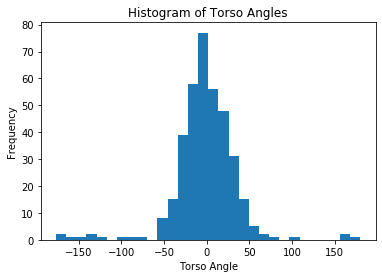

In [38]:
#Histogram of Torso Angle
plt.hist(poses_features[:, 0], bins=30)
#plt.vlines(np.mean(poses_features[:, 0]), 0, 80, ls='--')
plt.title('Histogram of Torso Angles')
plt.xlabel('Torso Angle')
plt.ylabel('Frequency')
#plt.savefig('viz/hist_torso_angles.png',dpi=500)
plt.show()
#print(np.mean(poses_features[:, 0]))

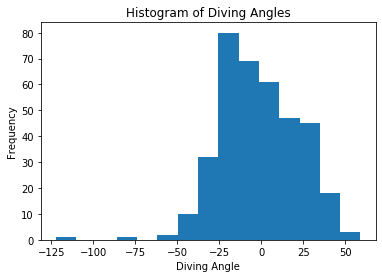

In [144]:
#Histogram of Diving Angle
#Seems diving right is the most common dive angle - perhaps because most right footers go
#to the keepers right
plt.hist(poses_features[:, 4], bins=15)
#plt.vlines(np.mean(poses_features[:, 4]), 0, 40, ls='--')
plt.title('Histogram of Diving Angles')
plt.xlabel('Diving Angle')
plt.ylabel('Frequency')
plt.savefig('viz/hist_dive_angles.png',dpi=500)
plt.show()

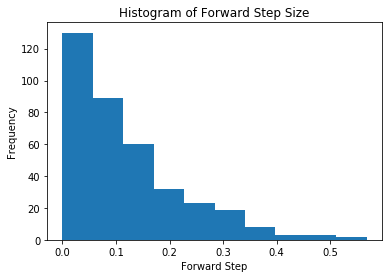

In [145]:
#Histogram of Forward Step Size
plt.hist(poses_features[:, 2], bins=10)
plt.title('Histogram of Forward Step Size')
plt.xlabel('Forward Step')
plt.ylabel('Frequency')
plt.savefig('viz/hist_forward_step.png',dpi=500)
plt.show()

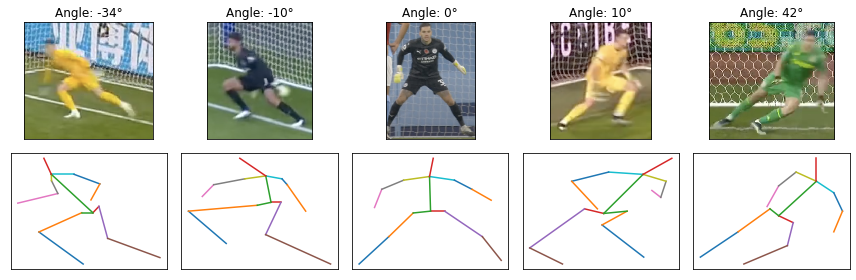

In [88]:
#Visualisation to show examples of diving angle
pose_ids = [1, 135, 132, 167, 190]
angle0 = pose_to_matrix(clean_poses[132])
angle10 = pose_to_matrix(clean_poses[167])
angle42 = pose_to_matrix(clean_poses[190])
angle_10 = pose_to_matrix(clean_poses[135])
angle_35 = pose_to_matrix(clean_poses[1])
angle_poses = [angle_35, angle_10, angle0, angle10, angle42]

%matplotlib inline
fig, ax = plt.subplots(nrows=2, ncols=len(angle_poses), figsize=(12, 4))
for i in range(len(angle_poses)):
    pose_3d = angle_poses[i]
    for e in range(len(mpii_edges)):
        ax[1,i].plot(pose_3d[mpii_edges[e]][:, 0], -1*pose_3d[mpii_edges[e]][:, 1])
    image = importImage('../PenaltyData/prem_19_20_20_21/f' + str(pose_ids[i]) + '.png')
    ax[0,i].imshow(image)
    ax[1,i].set_xticks([])
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])
    ax[1,i].set_yticks([])
    ax[0,i].set_title('Angle: ' + str(int(poses_features[pose_ids[i]][4])) + '°')
plt.tight_layout()
plt.savefig('viz/dive_angles.png', dpi=500)
plt.show()

### Remove Bad Model Poses
* Add PHOTO_ID of poses to remove to an array, to_remove.
* These are the camera-view invariant poses

In [26]:
def plotCleanPose(photo_id):
    #Camera-view invariance example
    path = '../PenaltyData/combined_data/'
    #photo_id = 30
    pose_id = getArrayID(joined_pose_3d_df, photo_id)

    fig = plt.figure(figsize=(15, 5))
    ax = fig.add_subplot(1, 3, 1)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_title('Image')
    ax = fig.add_subplot(1, 3, 2, projection='3d')
    plot3D(ax, pose_to_matrix(clean_poses[pose_id]))
    ax.set_title('Rotated 3D Pose')
    ax = fig.add_subplot(1, 3, 3)
    poseViz2D(ax, pose_to_matrix(clean_poses[pose_id]))
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title('Rotated 2D Projection')

    plt.tight_layout()
    #plt.savefig('viz/camera_invariance.png', dpi=500)
    plt.show()

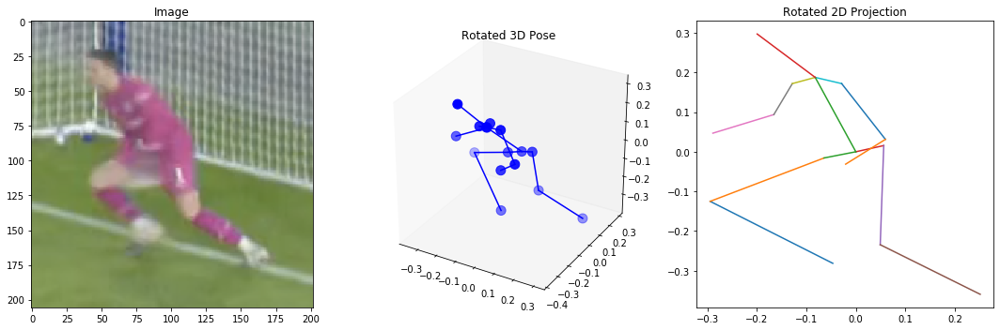

In [25]:
plotCleanPose(photo_id=323)

In [27]:
to_remove = np.array([0,5,7,9,10,11,15,17,19,23,25,26,27,30,31,36,40,48,52,53,56,57,58,59,62,65,66,
             68,69,75,77,79,80,84,86,87,89,92,93,96,97,99,100,101,102,103,108,111,113,116,
             119,121,125,126,135,138,140,141,143,145,146,147,152,155,159,165,166,169,173,
             177,178,179,186,187,188,190,191,192,194,203,207,211,213,220,221,222,224,227,
             235,240,241,242,248,249,257,260,261,262,268,270,271,272,275,276,277,278,279,
             281,282,291,294,299,301,305,312,314,317,322,324,331,333,335,336,341,347,349,351,
             352,362,368,376,382,387,392,394,395])
print(len(to_remove))

136


In [28]:
#Good Poses DataFrame
good_poses_3d_df = joined_pose_3d_df.drop(to_remove)

In [29]:
good_poses_3d_df.head()

,pen_taker,outcome,goalkeepers,0,1,2,3,4,5,6,...,38,39,40,41,42,43,44,45,46,47
1,Eden Hazard,Goal,Karl Darlow,-0.171875,0.359375,0.165714,-0.156250,0.250000,0.315193,0.062500,...,0.029968,-0.171875,-0.234375,0.037787,0.203125,-0.031250,-0.065823,0.187500,0.234375,-0.155435
3,Joshua King,Goal,Jordan Pickford,-0.359375,0.406250,-0.032765,-0.156250,0.171875,0.101421,-0.078125,...,-0.129461,0.171875,-0.203125,-0.091516,0.203125,-0.031250,0.010528,0.234375,0.046875,-0.102935
4,Wayne Mark Rooney,Goal,Mathew Ryan,-0.171875,0.281250,-0.017270,-0.171875,0.062500,0.132535,-0.062500,...,-0.123473,0.078125,-0.062500,-0.169144,0.093750,0.062500,-0.114870,0.093750,0.187500,-0.189607
6,Glenn Murray,Saved,Kasper Schmeichel,-0.484375,0.343750,-0.040460,-0.296875,0.218750,0.226595,-0.109375,...,-0.030425,0.203125,-0.218750,-0.031844,0.265625,-0.046875,0.022101,0.125000,-0.062500,0.010645
13,Junior Stanislas,Goal,Wayne Hennessey,-0.343750,0.375000,-0.055004,-0.140625,0.218750,0.212009,-0.062500,...,-0.067645,0.203125,-0.234375,-0.074421,0.109375,-0.109375,0.054955,0.109375,-0.015625,0.026388


In [30]:
#Good Poses Matrix
good_poses_3d_arr = good_poses_3d_df.loc[:,'0':].values

### Good Poses - EDA

In [31]:
#Convert all the good poses to the features space
good_poses_features = PosesFeatureSpace(good_poses_3d_arr)

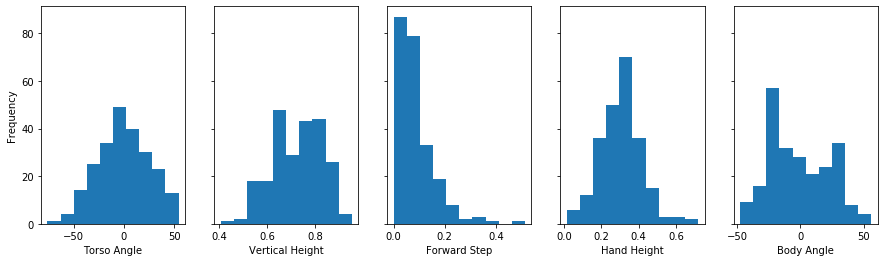

In [120]:
#Histograms of all self-created pose features
num_hist = good_poses_features.shape[1]
xlabs = ['Torso Angle', 'Vertical Height', 'Forward Step', 'Hand Height', 'Body Angle']
#Show histogram of all self-created body pose features
fig, ax = plt.subplots(nrows=1, ncols=num_hist, figsize=(15, 4), sharey=True)
for i in range(num_hist):
    ax[i].hist(good_poses_features[:, i])
    ax[i].set_xlabel(xlabs[i])
ax[0].set_ylabel('Frequency')
plt.savefig('viz/good_poses_feature_hists.png', dpi=500)
plt.show()

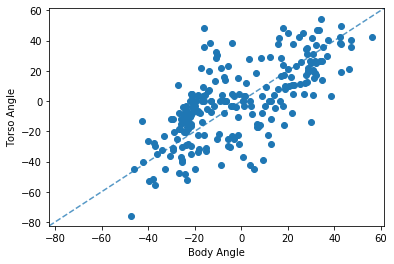

In [122]:
#Check for correlation in body angle vs torso angle
fig, ax = plt.subplots()
ax.scatter(good_poses_features[:,4], good_poses_features[:, 0])
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
# now plot both limits against eachother
ax.plot(lims, lims, '--', alpha=0.75, zorder=0)
ax.set_xlim(lims)
ax.set_ylim(lims)
plt.xlabel('Body Angle')
plt.ylabel('Torso Angle')
plt.savefig('viz/good_poses_angle_correlation.png', dpi=500)
plt.show()

In [32]:
def meanTorsoAngle(gk_name = 'David de Gea'):
    mean_angle = np.mean(np.abs(good_poses_features[good_poses_3d_df['goalkeepers'] == gk_name][:,0]))
    sample_size = np.sum(good_poses_3d_df['goalkeepers'] == gk_name)
    print("Mean Torso Angle: " + str(mean_angle) + " from " + str(sample_size) + " samples")
    return 

In [34]:
good_poses_features

array([[ -7.59464337,   0.796875  ,   0.13530089,   0.1875    ,
         21.80140949],
       [ 15.9453959 ,   0.8125    ,   0.02445773,   0.34375   ,
         21.54097592],
       [-15.9453959 ,   0.640625  ,   0.06832811,   0.109375  ,
         18.43494882],
       ...,
       [  4.08561678,   0.6875    ,   0.20028251,   0.21875   ,
        -18.72578785],
       [ -5.19442891,   0.546875  ,   0.04326144,   0.109375  ,
        -14.53445508],
       [ -8.74616226,   0.71875   ,   0.05416148,   0.234375  ,
          4.83041996]])

In [45]:
good_poses_3d_df

,pen_taker,outcome,goalkeepers,0,1,2,3,4,5,6,...,38,39,40,41,42,43,44,45,46,47
1,Eden Hazard,Goal,Karl Darlow,-0.171875,0.359375,0.165714,-0.156250,0.250000,0.315193,0.062500,...,0.029968,-0.171875,-0.234375,0.037787,0.203125,-0.031250,-0.065823,0.187500,0.234375,-0.155435
3,Joshua King,Goal,Jordan Pickford,-0.359375,0.406250,-0.032765,-0.156250,0.171875,0.101421,-0.078125,...,-0.129461,0.171875,-0.203125,-0.091516,0.203125,-0.031250,0.010528,0.234375,0.046875,-0.102935
4,Wayne Mark Rooney,Goal,Mathew Ryan,-0.171875,0.281250,-0.017270,-0.171875,0.062500,0.132535,-0.062500,...,-0.123473,0.078125,-0.062500,-0.169144,0.093750,0.062500,-0.114870,0.093750,0.187500,-0.189607
6,Glenn Murray,Saved,Kasper Schmeichel,-0.484375,0.343750,-0.040460,-0.296875,0.218750,0.226595,-0.109375,...,-0.030425,0.203125,-0.218750,-0.031844,0.265625,-0.046875,0.022101,0.125000,-0.062500,0.010645
13,Junior Stanislas,Goal,Wayne Hennessey,-0.343750,0.375000,-0.055004,-0.140625,0.218750,0.212009,-0.062500,...,-0.067645,0.203125,-0.234375,-0.074421,0.109375,-0.109375,0.054955,0.109375,-0.015625,0.026388
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,Juan Mata,Goal,Rui Patrício,-0.375000,0.328125,0.029034,-0.203125,0.140625,0.111337,-0.062500,...,-0.078539,0.234375,-0.234375,-0.095455,0.234375,-0.062500,0.000959,0.203125,0.062500,0.017230
396,Jamie Vardy,Goal,Hugo Lloris,-0.250000,0.359375,0.027719,-0.140625,0.171875,0.105528,-0.062500,...,-0.070367,0.125000,-0.234375,-0.061166,0.140625,-0.109375,-0.004779,0.046875,-0.062500,-0.027841
397,Anwar El Ghazi,Goal,"Edouard Mendy,Kepa Arrizabalaga",0.203125,0.281250,-0.109239,0.078125,0.125000,0.018368,-0.062500,...,-0.086994,0.125000,-0.234375,-0.061351,0.109375,-0.140625,0.053580,0.109375,-0.062500,0.035013
398,Gylfi Sigurðsson,Saved,Ederson,-0.093750,0.250000,-0.086090,-0.140625,0.062500,-0.046706,-0.046875,...,-0.096719,0.062500,-0.187500,-0.059244,0.140625,-0.125000,-0.010516,0.250000,-0.046875,-0.017533


In [33]:
name_converter = {
    'Alisson Ramsés Becker': 'Alisson',
    'Edouard Mendy,Kepa Arrizabalaga': 'Edouard Mendy',
    'David de Gea Quintana': 'David de Gea',
    'Ederson Santana de Moraes': 'Ederson',
    'Ralf Fährmann,Michael McGovern': 'Ralf Fährmann',
    'Rui Pedro dos Santos Patrício': 'Rui Patrício',
    'Vicente Guaita Panadero': 'Vicente Guaita'
}

In [34]:
#Convert names
good_poses_3d_df['goalkeepers'].replace(name_converter, inplace=True)

In [32]:
good_poses_3d_df

,pen_taker,outcome,goalkeepers,0,1,2,3,4,5,6,...,38,39,40,41,42,43,44,45,46,47
1,Eden Hazard,Goal,Karl Darlow,-0.171875,0.359375,0.165714,-0.156250,0.250000,0.315193,0.062500,...,0.029968,-0.171875,-0.234375,0.037787,0.203125,-0.031250,-0.065823,0.187500,0.234375,-0.155435
3,Joshua King,Goal,Jordan Pickford,-0.359375,0.406250,-0.032765,-0.156250,0.171875,0.101421,-0.078125,...,-0.129461,0.171875,-0.203125,-0.091516,0.203125,-0.031250,0.010528,0.234375,0.046875,-0.102935
4,Wayne Mark Rooney,Goal,Mathew Ryan,-0.171875,0.281250,-0.017270,-0.171875,0.062500,0.132535,-0.062500,...,-0.123473,0.078125,-0.062500,-0.169144,0.093750,0.062500,-0.114870,0.093750,0.187500,-0.189607
6,Glenn Murray,Saved,Kasper Schmeichel,-0.484375,0.343750,-0.040460,-0.296875,0.218750,0.226595,-0.109375,...,-0.030425,0.203125,-0.218750,-0.031844,0.265625,-0.046875,0.022101,0.125000,-0.062500,0.010645
13,Junior Stanislas,Goal,Wayne Hennessey,-0.343750,0.375000,-0.055004,-0.140625,0.218750,0.212009,-0.062500,...,-0.067645,0.203125,-0.234375,-0.074421,0.109375,-0.109375,0.054955,0.109375,-0.015625,0.026388
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,Juan Mata,Goal,Rui Patrício,-0.375000,0.328125,0.029034,-0.203125,0.140625,0.111337,-0.062500,...,-0.078539,0.234375,-0.234375,-0.095455,0.234375,-0.062500,0.000959,0.203125,0.062500,0.017230
396,Jamie Vardy,Goal,Hugo Lloris,-0.250000,0.359375,0.027719,-0.140625,0.171875,0.105528,-0.062500,...,-0.070367,0.125000,-0.234375,-0.061166,0.140625,-0.109375,-0.004779,0.046875,-0.062500,-0.027841
397,Anwar El Ghazi,Goal,Edouard Mendy,0.203125,0.281250,-0.109239,0.078125,0.125000,0.018368,-0.062500,...,-0.086994,0.125000,-0.234375,-0.061351,0.109375,-0.140625,0.053580,0.109375,-0.062500,0.035013
398,Gylfi Sigurðsson,Saved,Ederson,-0.093750,0.250000,-0.086090,-0.140625,0.062500,-0.046706,-0.046875,...,-0.096719,0.062500,-0.187500,-0.059244,0.140625,-0.125000,-0.010516,0.250000,-0.046875,-0.017533


In [95]:
meanTorsoAngle(gk_name = 'Joe Hart')

Mean Torso Angle: 14.931417178137556 from 1 samples


In [124]:
good_poses_3d_arr[0]

array([-0.171875  ,  0.359375  ,  0.16571386, -0.15625   ,  0.25      ,
        0.31519312,  0.0625    ,  0.03125   ,  0.0346509 , -0.0625    ,
        0.        , -0.02329957, -0.203125  ,  0.203125  ,  0.30888212,
       -0.390625  ,  0.421875  ,  0.03041298,  0.        ,  0.        ,
        0.        , -0.03125   , -0.234375  ,  0.00608439, -0.015625  ,
       -0.234375  , -0.01115526, -0.0625    , -0.375     ,  0.01573515,
        0.1875    ,  0.171875  ,  0.09150304,  0.203125  , -0.046875  ,
        0.08409479,  0.125     , -0.203125  ,  0.02996762, -0.171875  ,
       -0.234375  ,  0.03778665,  0.203125  , -0.03125   , -0.06582287,
        0.1875    ,  0.234375  , -0.15543501])

## Clustering

### Good Poses - 3D
* These are the poses that are clean and not bad approximations of pose
* Seems to produce more distint clusters according to the t-SNE and PCA plots

In [35]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering

In [36]:
def silhouetteInertia(poses):
    #Silhouette scores and inertia to find optimal number of clusters, k
    silhouette = []
    inertia = []
    for k in range(2, 11):
        kmeans = KMeans(n_clusters=k)
        clusters = kmeans.fit_predict(poses)
        silhouette.append(silhouette_score(poses, clusters))
        inertia.append(kmeans.inertia_)
    return (silhouette, inertia)

In [37]:
def getKMeans(poses, k):
    kmeans = KMeans(n_clusters=k)
    clusters_kmeans = kmeans.fit_predict(poses)
    return clusters_kmeans

In [38]:
def getGMM(poses, k):
    gmm = GaussianMixture(n_components=k, n_init=10)
    clusters_gmm = gmm.fit_predict(poses)
    return clusters_gmm

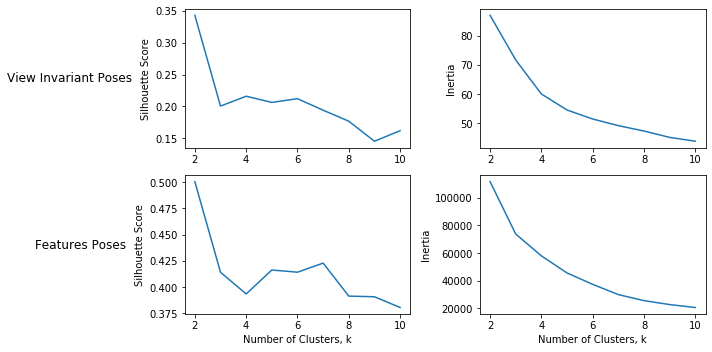

In [142]:
sil_cvi, iner_cvi = silhouetteInertia(good_poses_3d_arr)
sil_fea, iner_fea = silhouetteInertia(good_poses_features)

x = list(range(2, 11))
rows = ['View Invariant Poses', 'Features Poses']
pad = 5

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 5))
axes[0, 0].plot(x, sil_cvi)
axes[0, 1].plot(x, iner_cvi)
axes[1, 0].plot(x, sil_fea)
axes[1, 1].plot(x, iner_fea)
axes[1, 0].set_xlabel('Number of Clusters, k')
axes[1, 1].set_xlabel('Number of Clusters, k')
for i in range(2):
    axes[i, 0].set_ylabel('Silhouette Score')
    axes[i, 1].set_ylabel('Inertia')
    
for ax, row in zip(axes[:,0], rows):
    ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                size='large', ha='right', va='center')
    
plt.tight_layout()
plt.savefig('viz/good_silhouette_inertia_2.png', dpi=500)
plt.show()

In [143]:
#KMeans
k=2
good_clusters_3d_kmeans = getKMeans(good_poses_3d_arr, k=k)
#GMM
good_clusters_3d_gmm = getGMM(good_poses_3d_arr, k=k)
#Hierarchical Clustering
good_clusters_3d_hier = AgglomerativeClustering(n_clusters = k, affinity='euclidean', linkage='ward').fit_predict(good_poses_3d_arr)

In [49]:
def plotManifold(pose_arr, kmeans_labels, gmm_labels, hier_labels, k, save):
    tsne_raw = TSNE(n_components=2).fit_transform(pose_arr)
    pca_raw = PCA(n_components=2).fit_transform(pose_arr)
    lle_raw = LocallyLinearEmbedding(n_components=2, n_neighbors=5).fit_transform(pose_arr)
    colors_kmeans = cm.nipy_spectral(kmeans_labels.astype(float) / k)
    colors_gmm = cm.rainbow(gmm_labels.astype(float) / k)
    colors_hier = cm.coolwarm(hier_labels.astype(float) / k)
    rows = ['t-SNE', 'PCA', 'LLE']
    
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
    axes[0, 0].scatter(tsne_raw[:,0], tsne_raw[:,1], c=colors_kmeans)
    axes[0, 0].set_title('K-Means', size=16)
    axes[1, 0].scatter(pca_raw[:,0], pca_raw[:,1], c=colors_kmeans)
    axes[2, 0].scatter(lle_raw[:,0], lle_raw[:,1], c=colors_kmeans)
    
    axes[0, 1].scatter(tsne_raw[:,0], tsne_raw[:,1], c=colors_gmm)
    axes[0, 1].set_title('Gaussian Mixture Model', size=16)
    axes[1, 1].scatter(pca_raw[:,0], pca_raw[:,1], c=colors_gmm)
    axes[2, 1].scatter(lle_raw[:,0], lle_raw[:,1], c=colors_gmm)
    
    axes[0, 2].scatter(tsne_raw[:,0], tsne_raw[:,1], c=colors_hier)
    axes[0, 2].set_title('Hierarchical Clustering', size=16)
    axes[1, 2].scatter(pca_raw[:,0], pca_raw[:,1], c=colors_hier)
    axes[2, 2].scatter(lle_raw[:,0], lle_raw[:,1], c=colors_hier)
    
    for ax, row in zip(axes[:,0], rows):
        ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 4, 0),
                    xycoords=ax.yaxis.label, textcoords='offset points',
                    size=16, ha='right', va='center')
    
    plt.savefig('viz/' + save + '.png', dpi=500)
    plt.show()

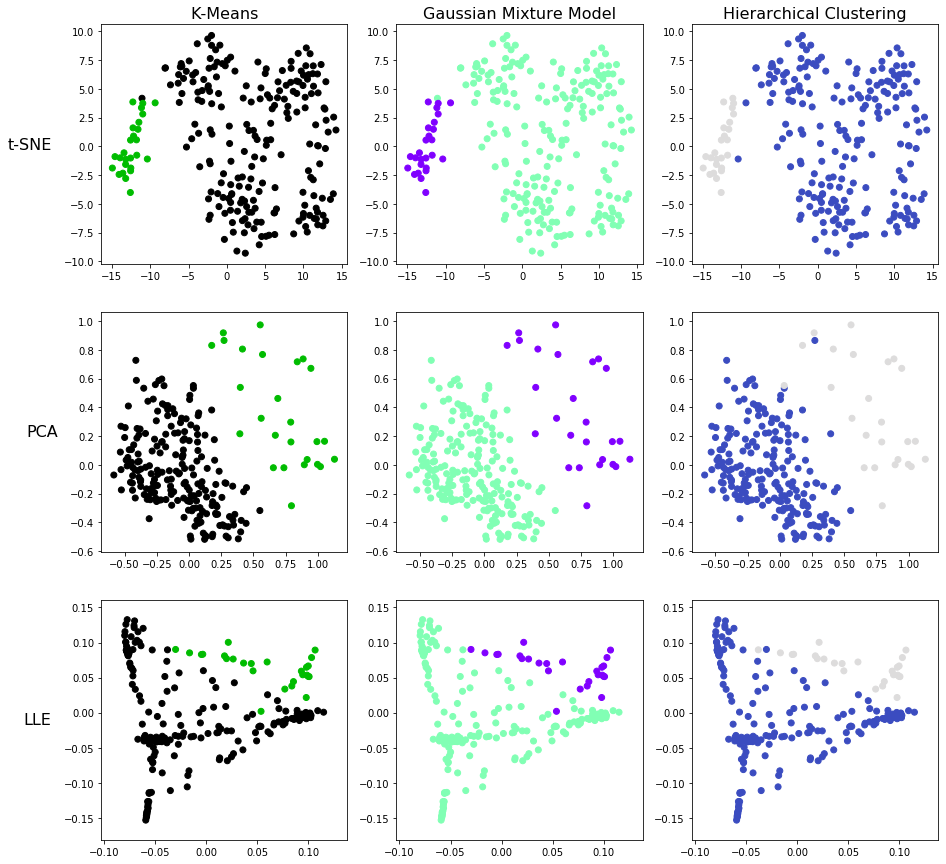

In [145]:
plotManifold(good_poses_3d_arr, good_clusters_3d_kmeans, good_clusters_3d_gmm,
             good_clusters_3d_hier, k=k, save='good_poses_cluster_all_2')

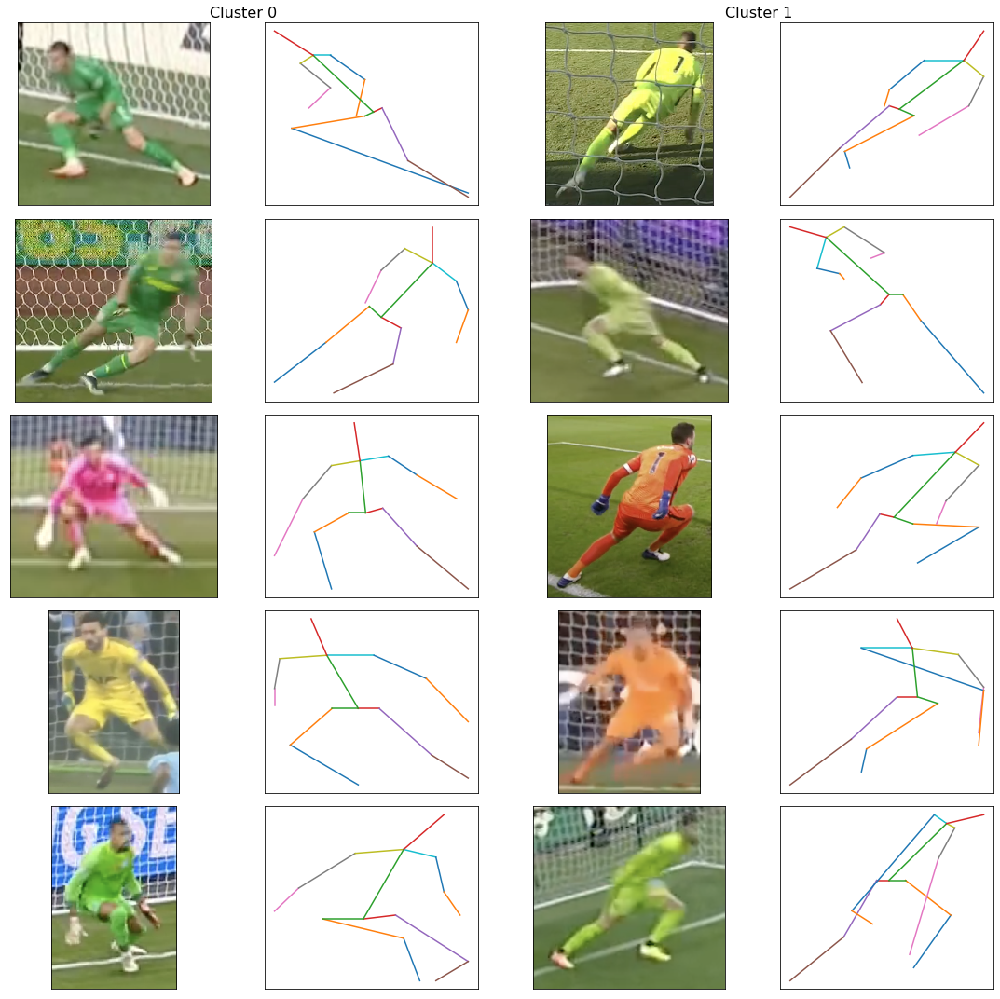

In [148]:
#KMeans - 3D pose, 2D pose viz cluster examples
#Use for 2 clusters on 3D data
path = '../PenaltyData/combined_data/'
ax_array = [1, 5, 9, 13, 17]
fig = plt.figure(figsize=(15, 15))
for a in ax_array:
    arr_id = np.random.choice(np.where(good_clusters_3d_kmeans == 0)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 4, a)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 4, a+1)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(0), position=(-0.1, 1), size=16)
        
    arr_id = np.random.choice(np.where(good_clusters_3d_kmeans == 1)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 4, a+2)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 4, a+3)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(1), position=(-0.1, 1), size=16)
    
plt.tight_layout()
plt.savefig('viz/good_poses_3d_kmeans_examples_2.png', dpi=500)
plt.show()

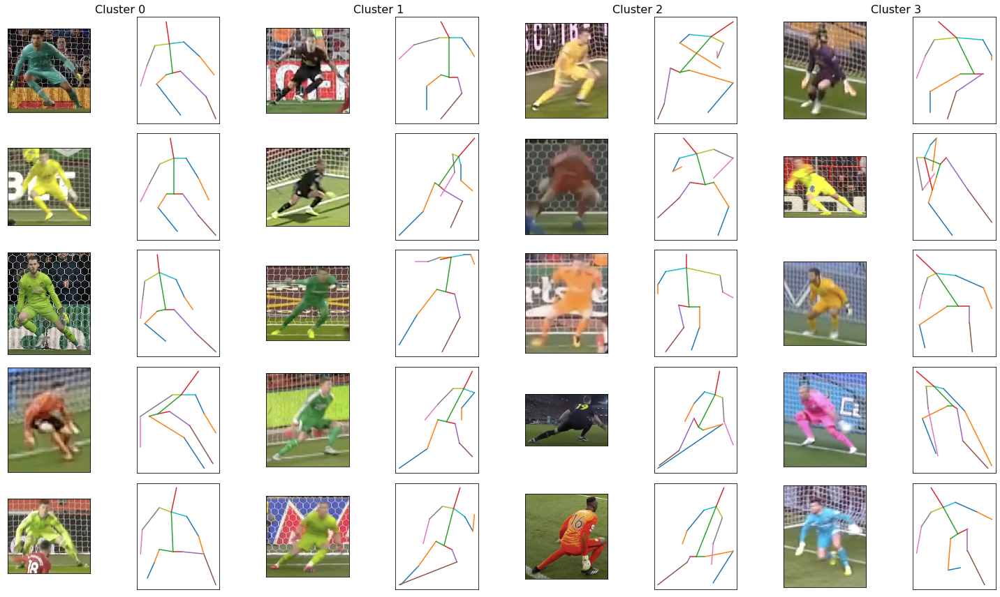

In [132]:
#KMeans - 3D pose, 2D pose viz cluster examples
#Use for 4 clusters
path = '../PenaltyData/combined_data/'
ax_array = [1, 9, 17, 25, 33]
fig = plt.figure(figsize=(20, 12))
for a in ax_array:
    arr_id = np.random.choice(np.where(good_clusters_3d_kmeans == 0)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 8, a)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 8, a+1)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(0), position=(-0.2, 1), size=16)
        
    arr_id = np.random.choice(np.where(good_clusters_3d_kmeans == 1)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 8, a+2)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 8, a+3)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(1), position=(-0.2, 1), size=16)
        
    arr_id = np.random.choice(np.where(good_clusters_3d_kmeans == 2)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 8, a+4)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 8, a+5)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(2), position=(-0.2, 1), size=16)
        
    arr_id = np.random.choice(np.where(good_clusters_3d_kmeans == 3)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 8, a+6)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 8, a+7)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(3), position=(-0.2, 1), size=16)
plt.tight_layout()
plt.savefig('viz/good_poses_2d_kmeans_examples.png', dpi=500)
plt.show()

### Good Poses - 2D
* These are the 2D projection on to the x-y plane of the good camera-view invariant 3D poses

In [615]:
to_delete = np.array([ x-1 for x in range(0,49) if x%3==0][1:])
good_poses_2d_proj = np.delete(good_poses_3d_arr, to_delete, 1)

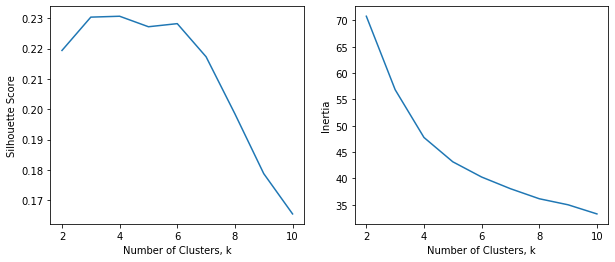

In [619]:
sil, iner = silhouetteInertia(good_poses_2d_proj)
x = list(range(2, 11))
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
ax[0].plot(x, sil)
ax[0].set_xlabel('Number of Clusters, k')
ax[0].set_ylabel('Silhouette Score')
ax[1].plot(x, iner)
ax[1].set_xlabel('Number of Clusters, k')
ax[1].set_ylabel('Inertia')
plt.savefig('viz/good_poses_2d_silhouette_inertia.png', dpi=500)
plt.show()

In [624]:
#KMeans
k=4
good_clusters_2d = getKMeans(good_poses_2d_proj, k=k)

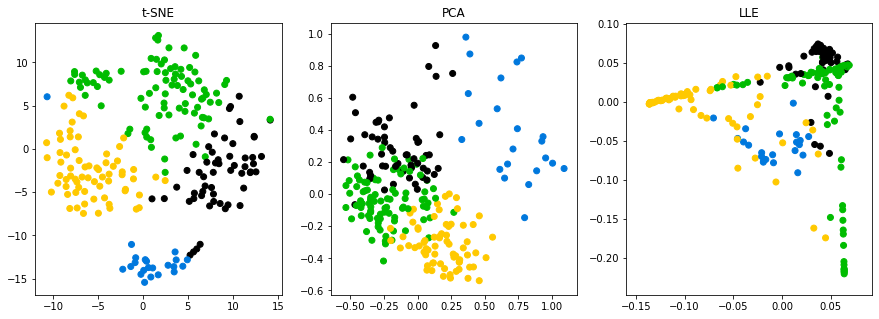

In [629]:
plotManifold(good_poses_2d_proj, good_clusters_2d, k=k, save='test')

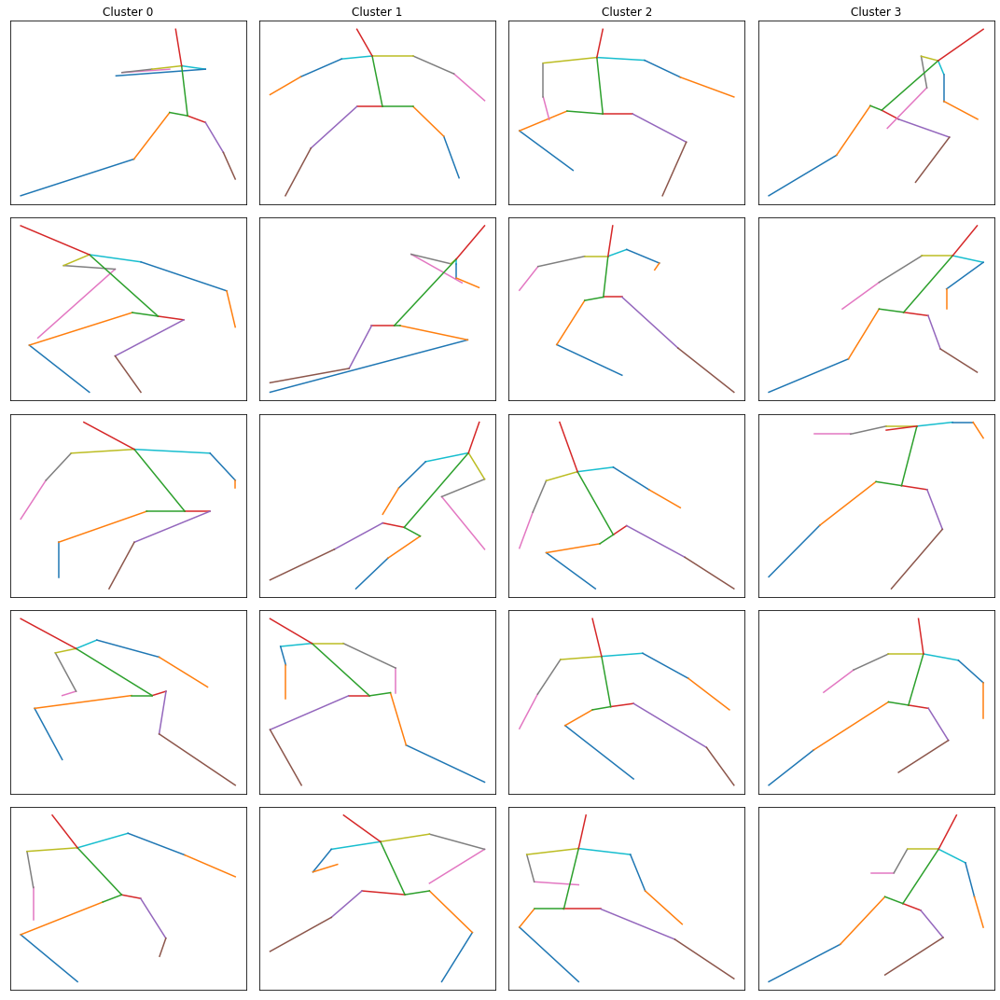

In [641]:
#KMeans - 3D pose, 2D pose viz cluster examples
ax_array = [1, 5, 9, 13, 17]
fig = plt.figure(figsize=(15, 15))
for a in ax_array:
    ax = fig.add_subplot(5, 4, a)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[np.random.choice(np.where(good_clusters_2d == 0)[0])]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(0))
    ax = fig.add_subplot(5, 4, a+1)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[np.random.choice(np.where(good_clusters_2d == 1)[0])]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(1))
    ax = fig.add_subplot(5, 4, a+2)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[np.random.choice(np.where(good_clusters_2d == 2)[0])]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(2))
    ax = fig.add_subplot(5, 4, a+3)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[np.random.choice(np.where(good_clusters_2d == 3)[0])]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(3))
plt.tight_layout()
plt.savefig('viz/good_poses_2d_proj_kmeans_examples.png', dpi=500)
plt.show()

### Good poses - Features
* Here, the dive direction encoded through positive or negative torso/body angle

In [117]:
#KMeans
k=2
good_clusters_features_kmeans = getKMeans(good_poses_features, k=k)
#GMM
good_clusters_features_gmm = getGMM(good_poses_features, k=k)
#Hierarchical Clustering
good_clusters_features_hier = AgglomerativeClustering(n_clusters = k, affinity='euclidean', linkage='ward').fit_predict(good_poses_features)

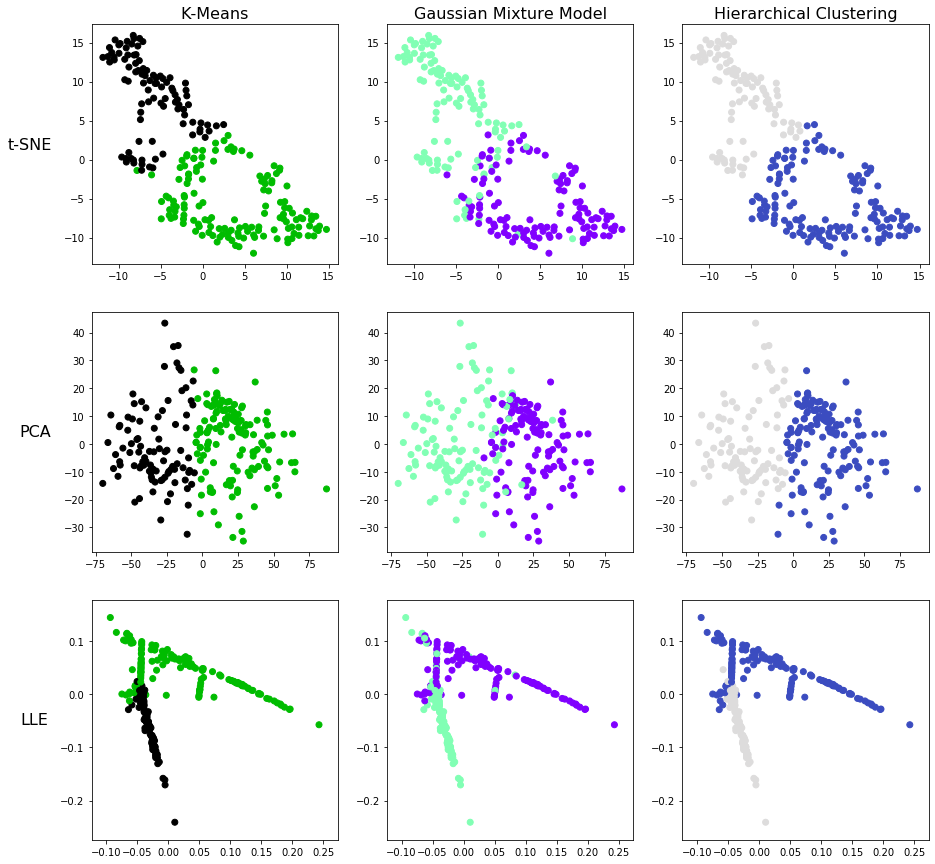

In [118]:
plotManifold(good_poses_features, good_clusters_features_kmeans, good_clusters_features_gmm,
             good_clusters_features_hier, k=k, save='good_poses_cluster_feat_all')

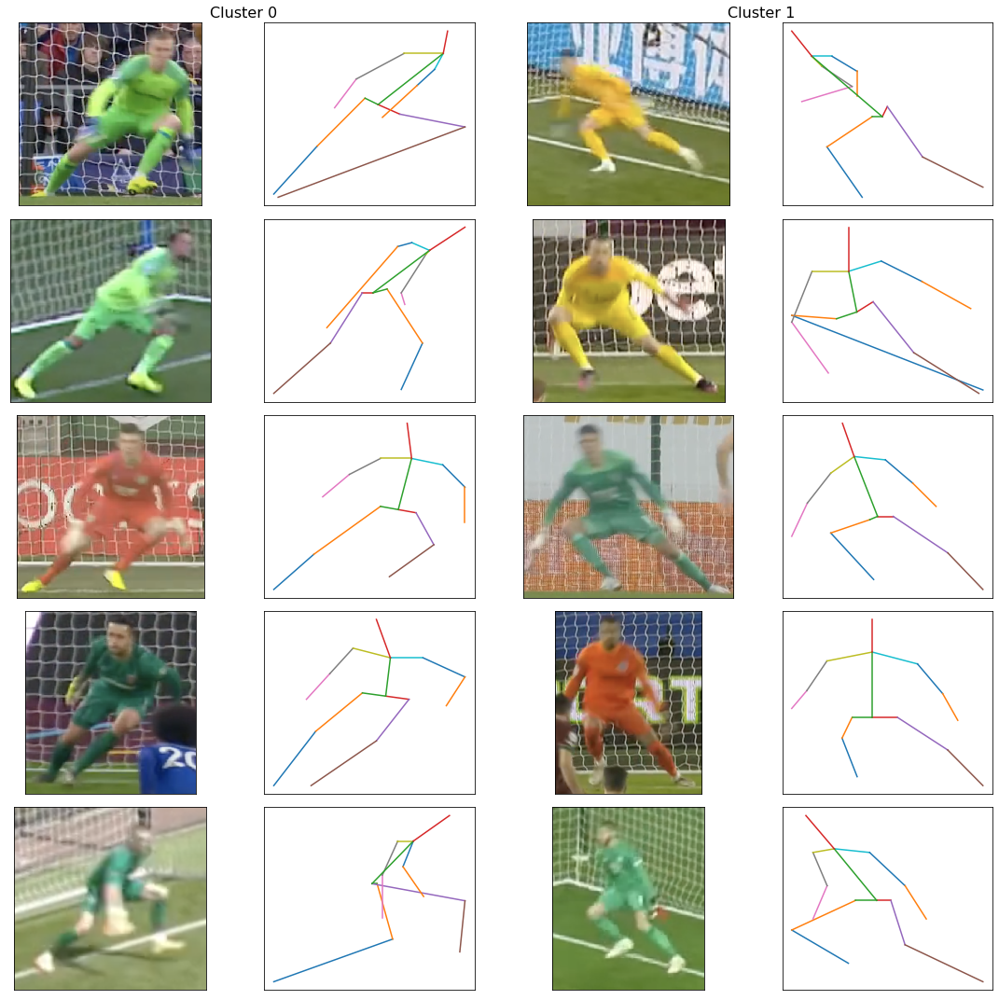

In [129]:
#KMeans - 3D pose, 2D pose viz cluster examples
path = '../PenaltyData/combined_data/'
ax_array = [1, 5, 9, 13, 17]
fig = plt.figure(figsize=(15, 15))
for a in ax_array:
    arr_id = np.random.choice(np.where(good_clusters_features_kmeans == 0)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 4, a)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 4, a+1)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(0), position=(-0.1, 1), size=16)
        
    arr_id = np.random.choice(np.where(good_clusters_features_kmeans == 1)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 4, a+2)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 4, a+3)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(1), position=(-0.1, 1), size=16)
    
plt.tight_layout()
plt.savefig('viz/good_poses_feat_kmeans_examples.png', dpi=500)
plt.show()

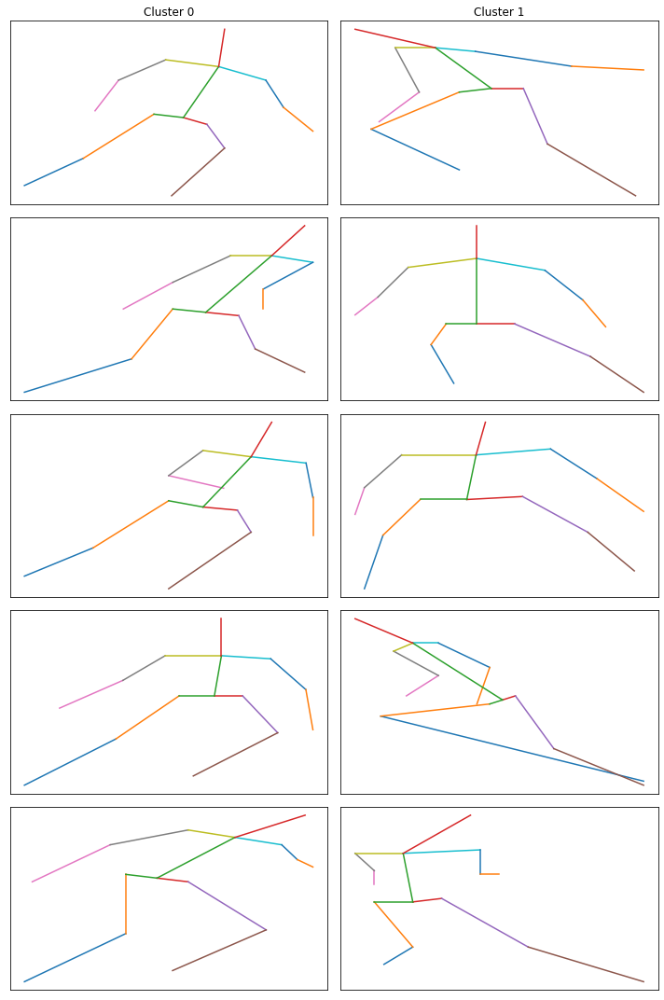

In [647]:
#KMeans - 3D pose, 2D pose viz cluster examples
ax_array = [1, 3, 5, 7, 9]
fig = plt.figure(figsize=(10, 15))
for a in ax_array:
    ax = fig.add_subplot(5, 2, a)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[np.random.choice(np.where(good_clusters_features == 0)[0])]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(0))
    ax = fig.add_subplot(5, 2, a+1)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[np.random.choice(np.where(good_clusters_features == 1)[0])]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(1))
plt.tight_layout()
plt.savefig('viz/good_poses_features_kmeans_examples.png', dpi=500)
plt.show()

* This section does not encode the dive direction

In [41]:
poses_feat_nodive = good_poses_features.copy()

In [43]:
poses_feat_nodive[:, 0] = np.abs(poses_feat_nodive[:, 0])
poses_feat_nodive[:, 4] = np.abs(poses_feat_nodive[:, 4])

In [44]:
poses_feat_nodive

array([[ 7.59464337,  0.796875  ,  0.13530089,  0.1875    , 21.80140949],
       [15.9453959 ,  0.8125    ,  0.02445773,  0.34375   , 21.54097592],
       [15.9453959 ,  0.640625  ,  0.06832811,  0.109375  , 18.43494882],
       ...,
       [ 4.08561678,  0.6875    ,  0.20028251,  0.21875   , 18.72578785],
       [ 5.19442891,  0.546875  ,  0.04326144,  0.109375  , 14.53445508],
       [ 8.74616226,  0.71875   ,  0.05416148,  0.234375  ,  4.83041996]])

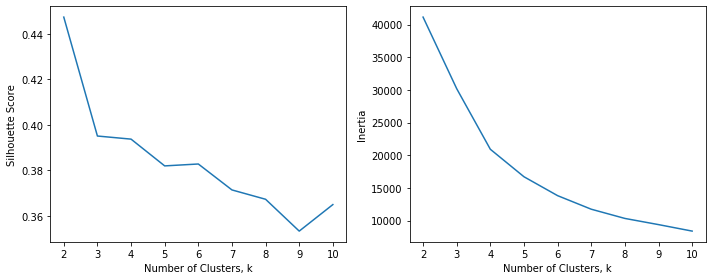

In [46]:
sil, iner = silhouetteInertia(poses_feat_nodive)
x = list(range(2, 11))
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
ax[0].plot(x, sil)
ax[0].set_xlabel('Number of Clusters, k')
ax[0].set_ylabel('Silhouette Score')
ax[1].plot(x, iner)
ax[1].set_xlabel('Number of Clusters, k')
ax[1].set_ylabel('Inertia')
plt.tight_layout()
plt.savefig('viz/good_poses_feat_nodive_silhouette_inertia.png', dpi=500)
plt.show()

In [47]:
#KMeans
k=2
good_clusters_features_kmeans = getKMeans(poses_feat_nodive, k=k)
#GMM
good_clusters_features_gmm = getGMM(poses_feat_nodive, k=k)
#Hierarchical Clustering
good_clusters_features_hier = AgglomerativeClustering(n_clusters = k, affinity='euclidean', linkage='ward').fit_predict(poses_feat_nodive)

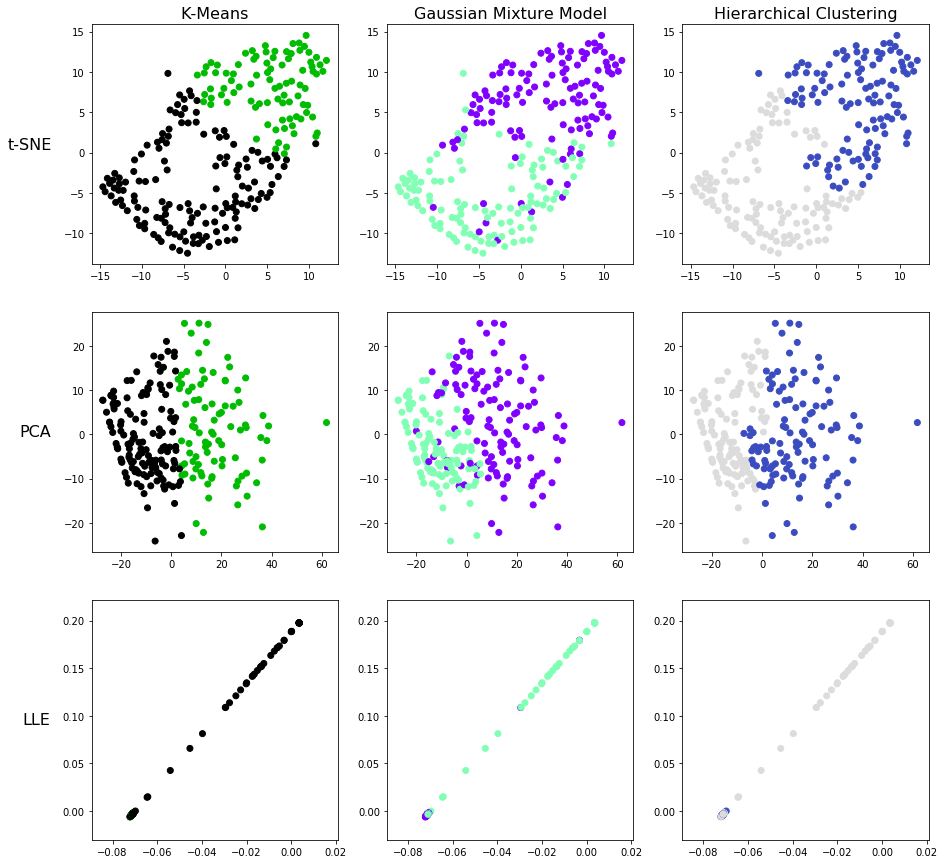

In [50]:
plotManifold(poses_feat_nodive, good_clusters_features_kmeans, good_clusters_features_gmm,
             good_clusters_features_hier, k=k, save='good_poses_cluster_feat_nodive')

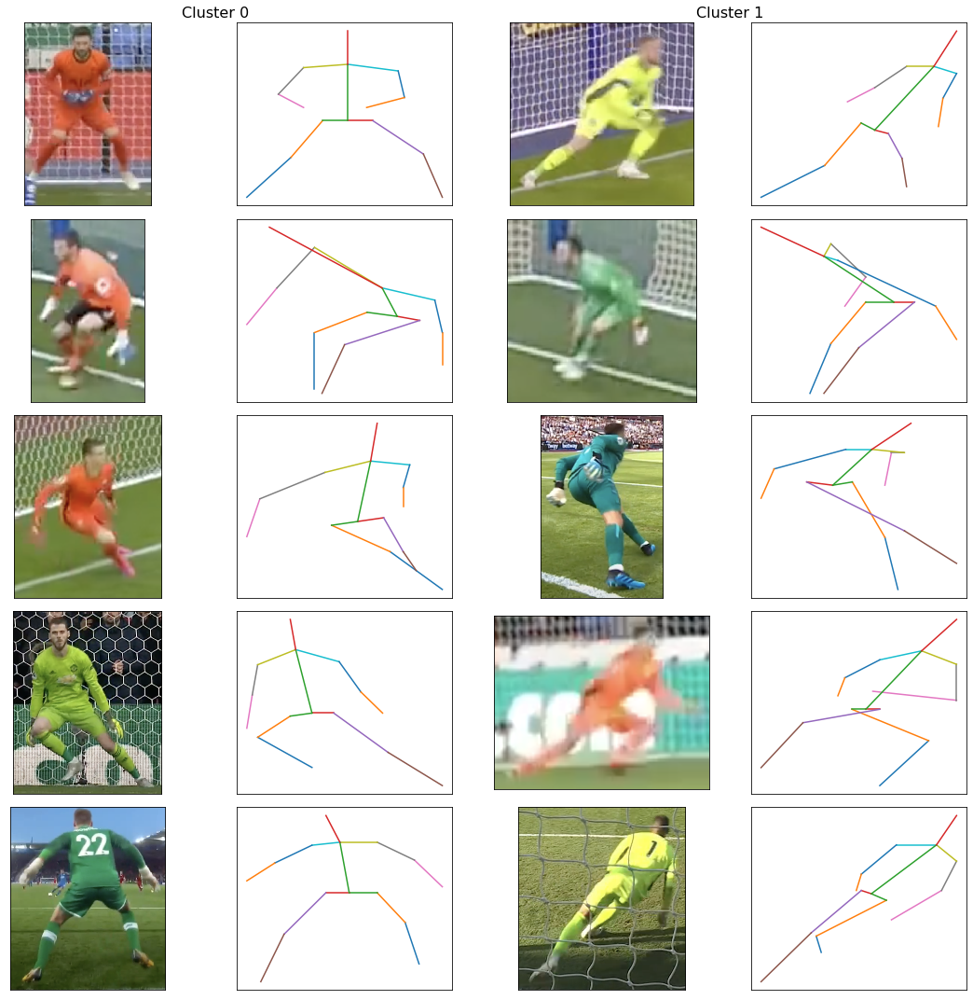

In [57]:
#KMeans - 3D pose, 2D pose viz cluster examples
path = '../PenaltyData/combined_data/'
ax_array = [1, 5, 9, 13, 17]
fig = plt.figure(figsize=(15, 15))
for a in ax_array:
    arr_id = np.random.choice(np.where(good_clusters_features_kmeans == 0)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 4, a)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 4, a+1)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(0), position=(-0.1, 1), size=16)
        
    arr_id = np.random.choice(np.where(good_clusters_features_kmeans == 1)[0])
    photo_id = getImageID(good_poses_3d_df, arr_id)
    ax = fig.add_subplot(5, 4, a+2)
    ax.imshow(importImage(path + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax = fig.add_subplot(5, 4, a+3)
    poseViz2D(ax, pose_to_matrix(good_poses_3d_arr[arr_id]))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    if a == 1:
        ax.set_title('Cluster ' + str(1), position=(-0.1, 1), size=16)
    
plt.tight_layout()
#plt.savefig('viz/good_poses_feat_nodive_kmeans_examples.png', dpi=500)
plt.show()

In [67]:
#Clearly the two clusters are distinguishing between dive angles,
#as shown by the differences in the mean torso and body angles between the 2 clusters
for i in range(poses_feat_nodive.shape[1]):
    print(np.mean(poses_feat_nodive[good_clusters_features_kmeans == 0, i]))

10.6697299820643
0.7490301724137931
0.08860120192394791
0.3245689655172414
16.196559354024266


In [68]:
for i in range(poses_feat_nodive.shape[1]):
    print(np.mean(poses_feat_nodive[good_clusters_features_kmeans == 1, i]))

36.12436677302962
0.671875
0.08021081708248179
0.26509232954545453
27.55632629715099


In [78]:
good_poses_3d_df

,pen_taker,outcome,goalkeepers,0,1,2,3,4,5,6,...,39,40,41,42,43,44,45,46,47,cluster
1,Eden Hazard,Goal,Karl Darlow,-0.171875,0.359375,0.165714,-0.156250,0.250000,0.315193,0.062500,...,-0.171875,-0.234375,0.037787,0.203125,-0.031250,-0.065823,0.187500,0.234375,-0.155435,0
3,Joshua King,Goal,Jordan Pickford,-0.359375,0.406250,-0.032765,-0.156250,0.171875,0.101421,-0.078125,...,0.171875,-0.203125,-0.091516,0.203125,-0.031250,0.010528,0.234375,0.046875,-0.102935,0
4,Wayne Mark Rooney,Goal,Mathew Ryan,-0.171875,0.281250,-0.017270,-0.171875,0.062500,0.132535,-0.062500,...,0.078125,-0.062500,-0.169144,0.093750,0.062500,-0.114870,0.093750,0.187500,-0.189607,0
6,Glenn Murray,Saved,Kasper Schmeichel,-0.484375,0.343750,-0.040460,-0.296875,0.218750,0.226595,-0.109375,...,0.203125,-0.218750,-0.031844,0.265625,-0.046875,0.022101,0.125000,-0.062500,0.010645,1
13,Junior Stanislas,Goal,Wayne Hennessey,-0.343750,0.375000,-0.055004,-0.140625,0.218750,0.212009,-0.062500,...,0.203125,-0.234375,-0.074421,0.109375,-0.109375,0.054955,0.109375,-0.015625,0.026388,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,Juan Mata,Goal,Rui Patrício,-0.375000,0.328125,0.029034,-0.203125,0.140625,0.111337,-0.062500,...,0.234375,-0.234375,-0.095455,0.234375,-0.062500,0.000959,0.203125,0.062500,0.017230,0
396,Jamie Vardy,Goal,Hugo Lloris,-0.250000,0.359375,0.027719,-0.140625,0.171875,0.105528,-0.062500,...,0.125000,-0.234375,-0.061166,0.140625,-0.109375,-0.004779,0.046875,-0.062500,-0.027841,0
397,Anwar El Ghazi,Goal,Edouard Mendy,0.203125,0.281250,-0.109239,0.078125,0.125000,0.018368,-0.062500,...,0.125000,-0.234375,-0.061351,0.109375,-0.140625,0.053580,0.109375,-0.062500,0.035013,0
398,Gylfi Sigurðsson,Saved,Ederson,-0.093750,0.250000,-0.086090,-0.140625,0.062500,-0.046706,-0.046875,...,0.062500,-0.187500,-0.059244,0.140625,-0.125000,-0.010516,0.250000,-0.046875,-0.017533,0


In [74]:
cluster_analysis_df = good_poses_3d_df.copy()
cluster_analysis_df['cluster'] = good_clusters_features_kmeans

In [76]:
cluster_analysis_df = cluster_analysis_df[cluster_analysis_df['outcome'] != 'Off T'].copy()

In [81]:
cluster0 = cluster_analysis_df[cluster_analysis_df['cluster'] == 0]
cluster1 = cluster_analysis_df[cluster_analysis_df['cluster'] == 1]

In [84]:
#We find that 19.7% of on-target penalties when gk is in cluster 1 is saved 
#compared to 15.1% when gk is in cluster0 (smaller diving angle)
np.sum(cluster0['outcome'] == 'Saved') / cluster0.shape[0] #139 instances

0.1510791366906475

In [85]:
np.sum(cluster1['outcome'] == 'Saved') / cluster1.shape[0] #86 instances

0.19767441860465115

# Expected Saves
### Clean Data

In [33]:
from sklearn.preprocessing import StandardScaler

In [34]:
#Create dataframe of good poses features
good_poses_feat_df = pd.DataFrame({'outcome': good_poses_3d_df['outcome']})
good_poses_feat_df = pd.concat([good_poses_feat_df, pd.DataFrame(good_poses_features, index=good_poses_feat_df.index)], axis=1)
#Drops 8 observations where the strike was off target
good_poses_feat_df = good_poses_feat_df.loc[good_poses_feat_df['outcome']  != 'Off T',:]
good_poses_feat_df.columns = ['outcome','torso_angle','body_height','forward_step',
                              'hand_height','body_angle']

In [35]:
good_poses_feat_df.shape

(225, 6)

In [36]:
#Create dive right boolean feature
good_poses_feat_df['dive_right'] = np.zeros(good_poses_feat_df.shape[0])
good_poses_feat_df.loc[good_poses_feat_df['body_angle'] < 0, 'dive_right'] = 1
good_poses_feat_df.dive_right = good_poses_feat_df.dive_right.astype(int)

In [37]:
#Take absolute values of torso_angle and body_angle
good_poses_feat_df['torso_angle'] = np.abs(good_poses_feat_df['torso_angle'])
good_poses_feat_df['body_angle'] = np.abs(good_poses_feat_df['body_angle'])

In [38]:
#Make target variable boolean - 1=Save, 0=Goal
good_poses_feat_df['outcome'] = np.array((good_poses_feat_df['outcome'] == 'Saved').astype(int))

In [39]:
continuous_var = ['torso_angle','body_height','forward_step','hand_height','body_angle']

In [40]:
good_poses_feat_df

,outcome,torso_angle,body_height,forward_step,hand_height,body_angle,dive_right
1,0,7.594643,0.796875,0.135301,0.187500,21.801409,0
3,0,15.945396,0.812500,0.024458,0.343750,21.540976,0
4,0,15.945396,0.640625,0.068328,0.109375,18.434949,0
6,1,19.653824,0.812500,0.000435,0.343750,30.629998,0
13,0,23.629378,0.781250,0.126363,0.390625,17.969140,0
...,...,...,...,...,...,...,...
393,0,19.440035,0.796875,0.095770,0.296875,28.867159,0
396,0,0.000000,0.781250,0.054331,0.421875,0.753848,0
397,0,4.085617,0.687500,0.200283,0.218750,18.725788,1
398,1,5.194429,0.546875,0.043261,0.109375,14.534455,1


In [41]:
#Train/Test Split (70/30)
split_index = good_poses_feat_df.index[int(225*0.7)]
test_df = good_poses_feat_df.loc[split_index:, :].copy() #68
train_df = good_poses_feat_df.loc[:split_index-1, :].copy() #157 observations

In [42]:
#Standardise continuous variables
scaler = StandardScaler()
scaler.fit(train_df[continuous_var])
train_df[continuous_var] = scaler.transform(train_df[continuous_var])
test_df[continuous_var] = scaler.transform(test_df[continuous_var])

In [43]:
print(scaler.mean_)
print(scaler.var_)

[20.65194286  0.71994427  0.08267026  0.30483678 21.39844222]
[2.41030047e+02 1.19288086e-02 5.55910241e-03 1.14749758e-02
 1.40909161e+02]


In [122]:
train_df.to_csv('pose_features_train.csv', index=False)

### Logistic Regression - Feature Space
* From summary of logistic regression table we can see that none of the features are significant in predicting save probability. The simple conclusion here is that features obtained from body pose have no effect on save probability.
* We must note the relatively small sample size though.
* Despite the lack of significance, some of the predictor coefficients does match with our intuitions. A more inclined body and torso angle leads to higher save probability. The greater the forward step the smaller the chance of a save because the reaction time is cut. Diving right sees a small improvement in save probability, as strikers go to the keepers right more often than not.

In [110]:
import statsmodels.api as sm

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [128]:
full_df = train_df.append(test_df)
#full_df.to_csv('pose_features_full.csv', index=False)

In [129]:
#Add intercept term
#train_df['coef'] = np.ones(len(train_df))
full_df['coef'] = np.ones(len(full_df))

In [130]:
log_reg = sm.Logit(full_df['outcome'], full_df[full_df.columns[1:]]).fit()

Optimization terminated successfully.
         Current function value: 0.442830
         Iterations 6


In [131]:
log_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                outcome   No. Observations:                  225
Model:                          Logit   Df Residuals:                      218
Method:                           MLE   Df Model:                            6
Date:                Mon, 12 Jul 2021   Pseudo R-squ.:                 0.02486
Time:                        12:28:31   Log-Likelihood:                -99.637
converged:                       True   LL-Null:                       -102.18
Covariance Type:            nonrobust   LLR p-value:                    0.5335
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
torso_angle      0.0928      0.229      0.405      0.685      -0.356       0.541
body_height     -0.2325      0.230     -1.011      0.312      -0.683       0.218
forward_step    -0.1539      0.203     -0.758      0.449      -0.552       0.244
hand_height      0.1103      0.193      0.571      0.568      -0.268       0.489
body_angle       0.1882      0.203      0.925      0.355      -0.210       0.587
dive_right       0.1143      0.367      0.312      0.755      -0.604       0.833
coef            -1.6784      0.274     -6.133      0.000      -2.215      -1.142
================================================================================
"""

## Goalkeeper Pose Analysis
### Save-level analysis
* Show where this save ranks in the distribution of all the features derived using several histograms

In [44]:
good_poses_3d_df = good_poses_3d_df.loc[good_poses_3d_df['outcome'] != 'Off T', :].copy()

In [45]:
good_poses_feat_df['gk'] = good_poses_3d_df['goalkeepers']

In [72]:
good_poses_feat_df['striker'] = good_poses_3d_df['pen_taker']

In [73]:
good_poses_feat_df

,outcome,torso_angle,body_height,forward_step,hand_height,body_angle,dive_right,gk,striker
1,0,7.594643,0.796875,0.135301,0.187500,21.801409,0,Karl Darlow,Eden Hazard
3,0,15.945396,0.812500,0.024458,0.343750,21.540976,0,Jordan Pickford,Joshua King
4,0,15.945396,0.640625,0.068328,0.109375,18.434949,0,Mathew Ryan,Wayne Mark Rooney
6,1,19.653824,0.812500,0.000435,0.343750,30.629998,0,Kasper Schmeichel,Glenn Murray
13,0,23.629378,0.781250,0.126363,0.390625,17.969140,0,Wayne Hennessey,Junior Stanislas
...,...,...,...,...,...,...,...,...,...
393,0,19.440035,0.796875,0.095770,0.296875,28.867159,0,Rui Patrício,Juan Mata
396,0,0.000000,0.781250,0.054331,0.421875,0.753848,0,Hugo Lloris,Jamie Vardy
397,0,4.085617,0.687500,0.200283,0.218750,18.725788,1,Edouard Mendy,Anwar El Ghazi
398,1,5.194429,0.546875,0.043261,0.109375,14.534455,1,Ederson,Gylfi Sigurðsson


In [74]:
good_poses_feat_df.loc[3,:]

outcome                       0
torso_angle           15.945396
body_height              0.8125
forward_step           0.024458
hand_height             0.34375
body_angle            21.540976
dive_right                    0
gk              Jordan Pickford
striker             Joshua King
Name: 3, dtype: object

In [91]:
#Save-wise KDE Plots
def plotSavePercentiles(good_poses_feat_df, array_id=1):
    photo_id = getImageID(good_poses_feat_df, array_id)

    label_dict = {
        'torso_angle': 'Torso Angle',
        'body_height': 'Vertical Height',
        'forward_step': 'Forward Step',
        'hand_height': 'Hand Height',
        'body_angle': 'Body Angle'
    }
    fig = plt.figure(figsize=(10, 6))
    i = 1
    for feature in continuous_var:
        ax = fig.add_subplot(5, 2, i)
        ax = good_poses_feat_df[feature].plot.kde(c='black') #Plot KDE
        if feature == 'body_height':
            ax.set_xlim((0.2, np.max(good_poses_feat_df[feature])))
            ax.set_xticks([0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
        else:
            ax.set_xlim((0, np.max(good_poses_feat_df[feature])))
        ax.set_yticks([])
        ax.set_ylabel(label_dict[feature], rotation='horizontal', ha='right')

        value = good_poses_feat_df.loc[array_id, feature]
        ax.axvline(value, ls='--')
        i += 2

    gk_name = good_poses_feat_df.loc[photo_id,'gk']
    striker = good_poses_feat_df.loc[photo_id,'striker']
    outcome = 'Saved' if good_poses_feat_df.loc[photo_id,'outcome'] == 1 else 'Goal'

    ax = fig.add_subplot(5, 2, (2,6))
    ax.imshow(importImage('../PenaltyData/combined_data/' + str(photo_id) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('Goalkeeper: ' + gk_name + '\n' + 'Striker: ' + striker + '\n' + 'Outcome: ' + outcome)

    plt.tight_layout()
    plt.savefig('viz/gk_kde_save.png', dpi=500, bbox_inches = 'tight')
    plt.show()

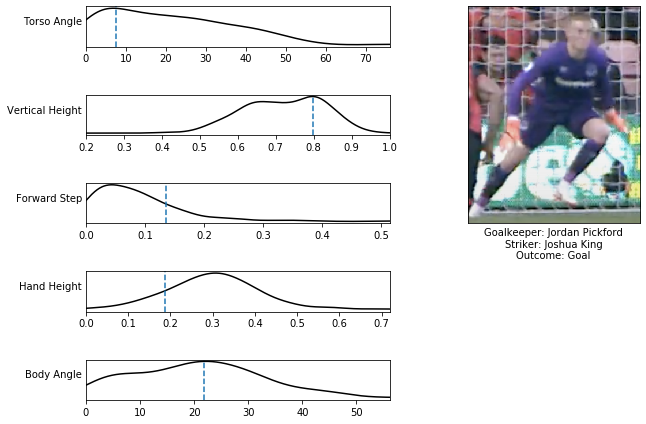

In [92]:
plotSavePercentiles(good_poses_feat_df, array_id=1)

In [105]:
good_poses_feat_df

,outcome,torso_angle,body_height,forward_step,hand_height,body_angle,dive_right,gk,striker
1,0,7.594643,0.796875,0.135301,0.187500,21.801409,0,Karl Darlow,Eden Hazard
3,0,15.945396,0.812500,0.024458,0.343750,21.540976,0,Jordan Pickford,Joshua King
4,0,15.945396,0.640625,0.068328,0.109375,18.434949,0,Mathew Ryan,Wayne Mark Rooney
6,1,19.653824,0.812500,0.000435,0.343750,30.629998,0,Kasper Schmeichel,Glenn Murray
13,0,23.629378,0.781250,0.126363,0.390625,17.969140,0,Wayne Hennessey,Junior Stanislas
...,...,...,...,...,...,...,...,...,...
393,0,19.440035,0.796875,0.095770,0.296875,28.867159,0,Rui Patrício,Juan Mata
396,0,0.000000,0.781250,0.054331,0.421875,0.753848,0,Hugo Lloris,Jamie Vardy
397,0,4.085617,0.687500,0.200283,0.218750,18.725788,1,Edouard Mendy,Anwar El Ghazi
398,1,5.194429,0.546875,0.043261,0.109375,14.534455,1,Ederson,Gylfi Sigurðsson


In [151]:
#Save-wise KDE Comparison Plots
def plotSavePercentilesComparison(good_poses_feat_df, photo_id=[1, 6]):

    label_dict = {
        'torso_angle': 'Torso Angle',
        'body_height': 'Vertical Height',
        'forward_step': 'Forward Step',
        'hand_height': 'Hand Height',
        'body_angle': 'Body Angle'
    }
    vline_cols = ['blue', 'red']
                
    fig = plt.figure(figsize=(10, 6))
    i = 1
    for feature in continuous_var:
        ax = fig.add_subplot(5, 2, i)
        ax = good_poses_feat_df[feature].plot.kde(c='black') #Plot KDE
        if feature == 'body_height':
            ax.set_xlim((0.2, np.max(good_poses_feat_df[feature])))
            ax.set_xticks([0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
        else:
            ax.set_xlim((0, np.max(good_poses_feat_df[feature])))
        ax.set_yticks([])
        ax.set_ylabel(label_dict[feature], rotation='horizontal', ha='right')
        value = good_poses_feat_df.loc[photo_id[0], feature]
        ax.axvline(value, ls='--', c=vline_cols[0])
        value = good_poses_feat_df.loc[photo_id[1], feature]
        ax.axvline(value, ls='--', c=vline_cols[1])
        i += 2

    gk_name = good_poses_feat_df.loc[photo_id[0],'gk']
    striker = good_poses_feat_df.loc[photo_id[0],'striker']
    outcome = 'Saved' if good_poses_feat_df.loc[photo_id[0],'outcome'] == 1 else 'Goal'
    
    gk_name_1 = good_poses_feat_df.loc[photo_id[1],'gk']
    striker_1 = good_poses_feat_df.loc[photo_id[1],'striker']
    outcome_1 = 'Saved' if good_poses_feat_df.loc[photo_id[1],'outcome'] == 1 else 'Goal'

    ax = fig.add_subplot(5, 2, (2,4))
    ax.imshow(importImage('../PenaltyData/combined_data/' + str(photo_id[0]) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('Goalkeeper: ' + gk_name + '\n' + 'Striker: ' + striker + '\n' + 'Outcome: ' + outcome)
    plt.setp(ax.spines.values(), color=vline_cols[0], lw=3)
    
    ax = fig.add_subplot(5, 2, (6,8))
    ax.imshow(importImage('../PenaltyData/combined_data/' + str(photo_id[1]) + '.png'))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('Goalkeeper: ' + gk_name_1 + '\n' + 'Striker: ' + striker_1 + '\n' + 'Outcome: ' + outcome_1)
    plt.setp(ax.spines.values(), color=vline_cols[1], lw=3)
    
    plt.tight_layout()
    plt.savefig('viz/gk_kde_save_comp.png', dpi=500, bbox_inches = 'tight')
    plt.show()

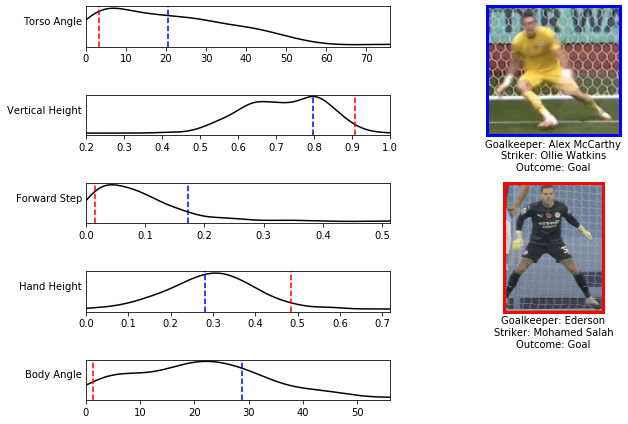

In [152]:
plotSavePercentilesComparison(good_poses_feat_df, photo_id=[306,315])

In [47]:
gk_features_df = good_poses_feat_df[continuous_var + ['gk']].groupby(['gk']).mean()

In [53]:
#GK-wise KDE Plots
def plotGKComparison(gk_name, gk_features_df, good_poses_feat_df):
    label_dict = {
        'torso_angle': 'Torso Angle',
        'body_height': 'Vertical Height',
        'forward_step': 'Forward Step',
        'hand_height': 'Hand Height',
        'body_angle': 'Body Angle'
    }
    vline_cols = ['blue', 'red']
    fig = plt.figure(figsize=(6, 6))
    i = 1
    for feature in continuous_var:
        ax = fig.add_subplot(5, 1, i)
        ax = gk_features_df[feature].plot.kde(c='black') #Plot KDE
        if feature == 'body_height':
            ax.set_xlim((0.4, np.max(gk_features_df[feature])))
        else:
            ax.set_xlim((0, np.max(gk_features_df[feature])))
        ax.set_yticks([])
        ax.set_ylabel(label_dict[feature], rotation='horizontal', ha='right')

        c=0
        for gk in gk_name:
            value = gk_features_df.loc[gk, feature]
            ax.axvline(value, ls='--', c=vline_cols[c])
            c+=1
        i += 1

        
    gk1_pens = np.sum(good_poses_feat_df['gk'] == gk_name[0])
    gk2_pens = np.sum(good_poses_feat_df['gk'] == gk_name[1])
    gk1_saves = np.sum(good_poses_feat_df[good_poses_feat_df['gk'] == gk_name[0]]['outcome'])
    gk2_saves = np.sum(good_poses_feat_df[good_poses_feat_df['gk'] == gk_name[1]]['outcome'])
    gk1_dr = np.round(np.mean(good_poses_feat_df[good_poses_feat_df['gk'] == gk_name[0]]['dive_right']),2)
    gk2_dr = np.round(np.mean(good_poses_feat_df[good_poses_feat_df['gk'] == gk_name[1]]['dive_right']),2)
    
    plt.figtext(0.47, 1.1, gk_name[1], fontsize='large', color=vline_cols[1], ha ='right')
    plt.figtext(0.53, 1.1, gk_name[0], fontsize='large', color=vline_cols[0], ha ='left')
    plt.figtext(0.50, 1.1, ' vs ', fontsize='large', color='k', ha ='center')
    
    plt.figtext(0.47, 1.05, str(gk2_saves) + ' / ' + str(gk2_pens), fontsize='large', color=vline_cols[1], ha ='right')
    plt.figtext(0.53, 1.05, str(gk1_saves) + ' / ' + str(gk1_pens), fontsize='large', color=vline_cols[0], ha ='left')
    plt.figtext(0.50, 1.05, ' : ', fontsize='large', color='k', ha ='center')
    plt.figtext(0.20, 1.05, 'Saved/Faced: ', fontsize='large', color='k', ha ='left')
    
    plt.figtext(0.47, 1, str(gk2_dr*100) + '%', fontsize='large', color=vline_cols[1], ha ='right')
    plt.figtext(0.53, 1, str(gk1_dr*100) + '%', fontsize='large', color=vline_cols[0], ha ='left')
    plt.figtext(0.50, 1, ' : ', fontsize='large', color='k', ha ='center')
    plt.figtext(0.20, 1, 'Dive Right: ', fontsize='large', color='k', ha ='left')
    
    plt.tight_layout()
    #plt.savefig('viz/gk_kde_comparison_ddg.png', dpi=500, bbox_inches = 'tight')
    plt.show()

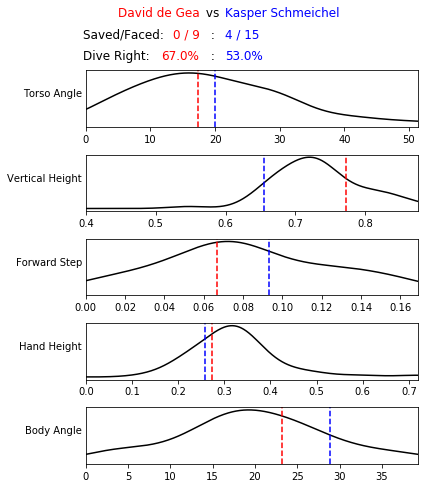

In [52]:
gk_name = ['Kasper Schmeichel', 'David de Gea']
plotGKComparison(gk_name, gk_features_df, good_poses_feat_df)

In [55]:
good_poses_3d_df

,pen_taker,outcome,goalkeepers,0,1,2,3,4,5,6,...,38,39,40,41,42,43,44,45,46,47
1,Eden Hazard,Goal,Karl Darlow,-0.171875,0.359375,0.165714,-0.156250,0.250000,0.315193,0.062500,...,0.029968,-0.171875,-0.234375,0.037787,0.203125,-0.031250,-0.065823,0.187500,0.234375,-0.155435
3,Joshua King,Goal,Jordan Pickford,-0.359375,0.406250,-0.032765,-0.156250,0.171875,0.101421,-0.078125,...,-0.129461,0.171875,-0.203125,-0.091516,0.203125,-0.031250,0.010528,0.234375,0.046875,-0.102935
4,Wayne Mark Rooney,Goal,Mathew Ryan,-0.171875,0.281250,-0.017270,-0.171875,0.062500,0.132535,-0.062500,...,-0.123473,0.078125,-0.062500,-0.169144,0.093750,0.062500,-0.114870,0.093750,0.187500,-0.189607
6,Glenn Murray,Saved,Kasper Schmeichel,-0.484375,0.343750,-0.040460,-0.296875,0.218750,0.226595,-0.109375,...,-0.030425,0.203125,-0.218750,-0.031844,0.265625,-0.046875,0.022101,0.125000,-0.062500,0.010645
13,Junior Stanislas,Goal,Wayne Hennessey,-0.343750,0.375000,-0.055004,-0.140625,0.218750,0.212009,-0.062500,...,-0.067645,0.203125,-0.234375,-0.074421,0.109375,-0.109375,0.054955,0.109375,-0.015625,0.026388
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,Juan Mata,Goal,Rui Patrício,-0.375000,0.328125,0.029034,-0.203125,0.140625,0.111337,-0.062500,...,-0.078539,0.234375,-0.234375,-0.095455,0.234375,-0.062500,0.000959,0.203125,0.062500,0.017230
396,Jamie Vardy,Goal,Hugo Lloris,-0.250000,0.359375,0.027719,-0.140625,0.171875,0.105528,-0.062500,...,-0.070367,0.125000,-0.234375,-0.061166,0.140625,-0.109375,-0.004779,0.046875,-0.062500,-0.027841
397,Anwar El Ghazi,Goal,Edouard Mendy,0.203125,0.281250,-0.109239,0.078125,0.125000,0.018368,-0.062500,...,-0.086994,0.125000,-0.234375,-0.061351,0.109375,-0.140625,0.053580,0.109375,-0.062500,0.035013
398,Gylfi Sigurðsson,Saved,Ederson,-0.093750,0.250000,-0.086090,-0.140625,0.062500,-0.046706,-0.046875,...,-0.096719,0.062500,-0.187500,-0.059244,0.140625,-0.125000,-0.010516,0.250000,-0.046875,-0.017533


### All Poses

### K-Means 

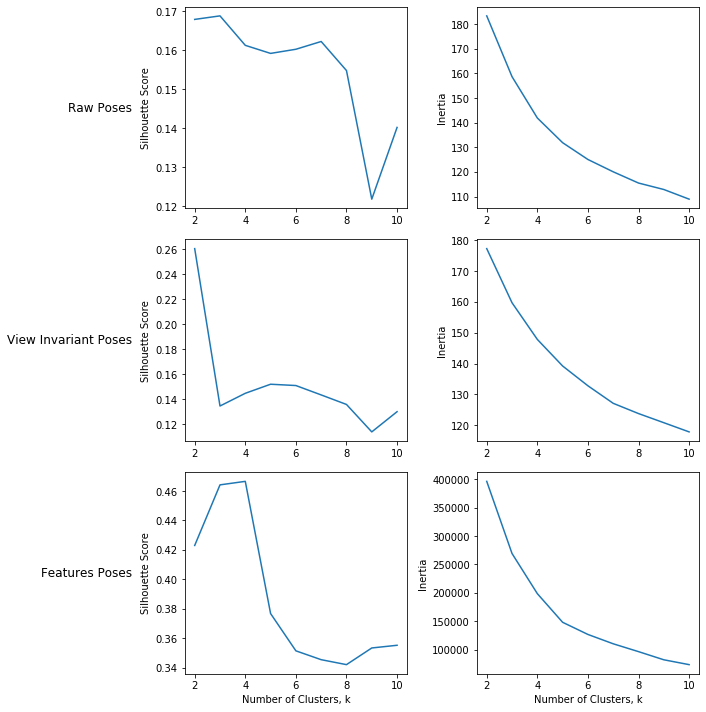

In [78]:
sil_raw, iner_raw = silhouetteInertia(pose_arr)
sil_cvi, iner_cvi = silhouetteInertia(clean_poses)
sil_fea, iner_fea = silhouetteInertia(poses_features)

x = list(range(2, 11))
rows = ['Raw Poses', 'View Invariant Poses', 'Features Poses']
pad = 5

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10, 10))
axes[0, 0].plot(x, sil_raw)
axes[0, 1].plot(x, iner_raw)
axes[1, 0].plot(x, sil_cvi)
axes[1, 1].plot(x, iner_cvi)
axes[2, 0].plot(x, sil_fea)
axes[2, 1].plot(x, iner_fea)
axes[2, 0].set_xlabel('Number of Clusters, k')
axes[2, 1].set_xlabel('Number of Clusters, k')
for i in range(3):
    axes[i, 0].set_ylabel('Silhouette Score')
    axes[i, 1].set_ylabel('Inertia')
    
for ax, row in zip(axes[:,0], rows):
    ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                size='large', ha='right', va='center')
    
plt.tight_layout()
plt.savefig('viz/silhouette_inertia.png', dpi=500)
plt.show()

In [23]:
#KMeans Raw Dataset
k_raw = 3
kmeans_raw = getKMeans(pose_arr, k=k_raw)

In [24]:
k_cvi = 2
kmeans_clean = getKMeans(clean_poses, k=k_cvi)

In [25]:
k_feat = 4
kmeans_features = getKMeans(poses_features, k=k_feat)

In [44]:
np.where(kmeans_raw.labels_ == 1)[0]

array([  0,   3,   4,   5,   6,   8,  13,  28,  30,  54,  65,  78,  79,
        83,  87,  92,  96,  97,  99, 108, 109, 116, 118, 122, 129, 131,
       161, 165, 166, 167, 172, 179, 180, 193, 203, 218, 223, 225, 230,
       231, 232, 243, 247, 253, 263, 266, 270, 275, 278, 279, 285, 287,
       288, 292, 293, 295, 296, 298, 299, 303, 306, 307, 310, 313, 316,
       319, 321, 323, 324, 334, 339, 343, 347, 349, 355, 357, 358, 362,
       364, 366])

In [63]:
def showClusterExamples(model_labels, poses, n_examples, k, save):
    pose_ids = np.zeros((n_examples, k))
    fig, ax = plt.subplots(nrows=n_examples, ncols=k, figsize=(10, 15))
    for i in range(k):
        image_ids = np.where(model_labels == i)[0]
        image_ids = image_ids[image_ids < 217]
        pose_ids[:, i] = np.random.choice(image_ids, n_examples, replace=False)
        ax[0,i].set_title('Cluster ' + str(i))
    for i in range(n_examples):
        for j in range(k):
            pose_3d = pose_to_matrix(poses[int(pose_ids[i, j])])
            for e in range(len(mpii_edges)):
                ax[i,j].plot(pose_3d[mpii_edges[e]][:, 0], -pose_3d[mpii_edges[e]][:, 1], c='b')
            #for keypoint in range(len(pose_3d)):
                #ax[i,j].scatter(pose_3d[keypoint][:2][0], -pose_3d[keypoint][:2][1], c='b')
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
    plt.tight_layout()
    plt.savefig('viz/' + save + '.png', dpi=500)
    plt.show()

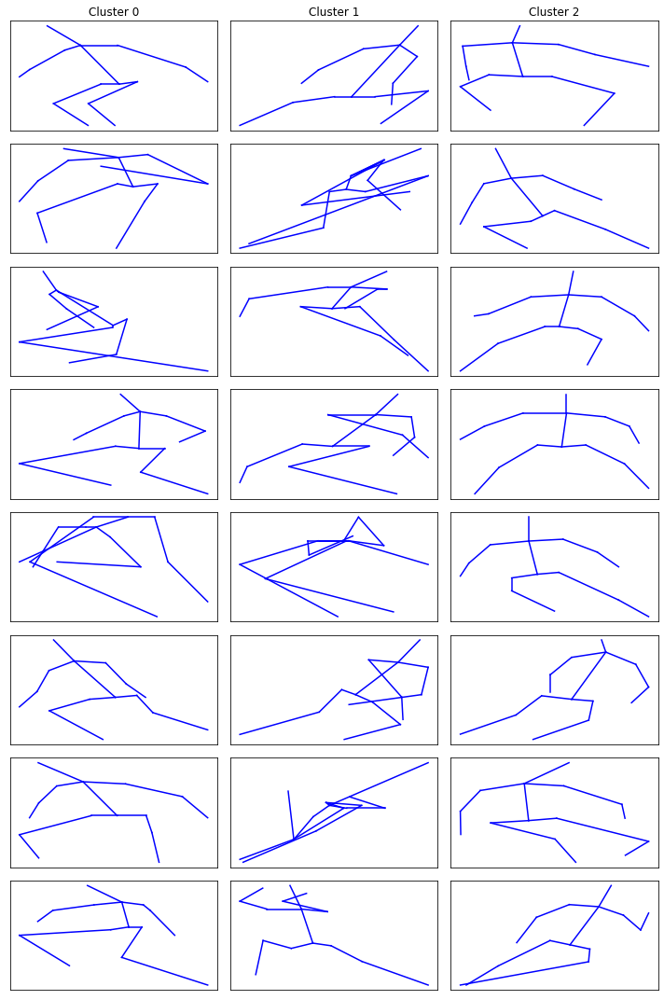

In [66]:
#Cluster 0 examples
n_examples = 8
showClusterExamples(kmeans_raw.labels_, clean_poses, n_examples, k_raw, save='kmeans_raw_2d_examples')

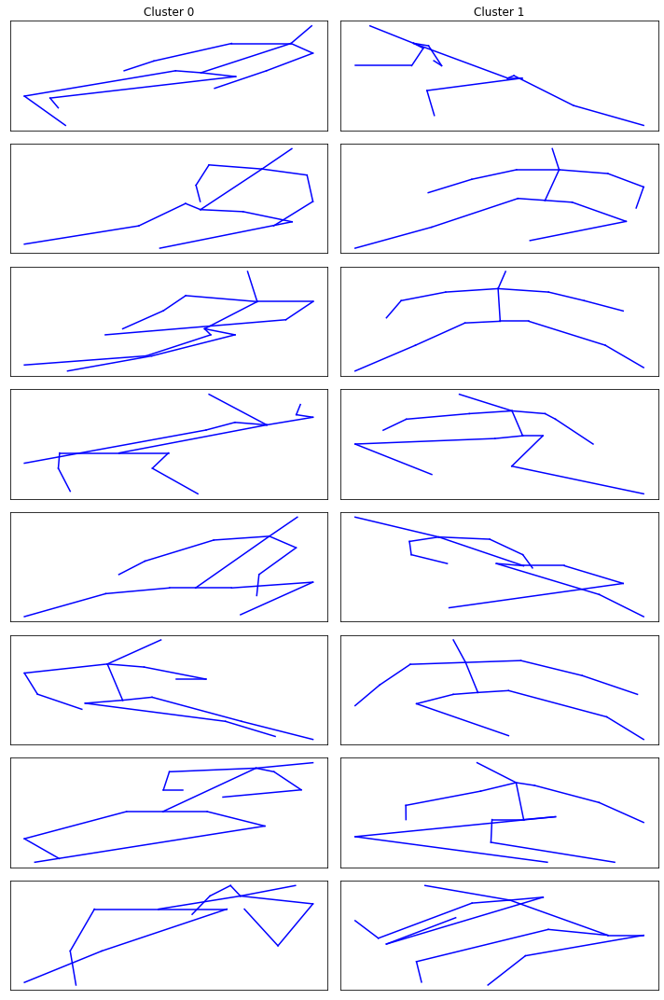

In [70]:
showClusterExamples(kmeans_clean.labels_, clean_poses, n_examples, k_cvi, save='kmeans_cvi_2d_examples')

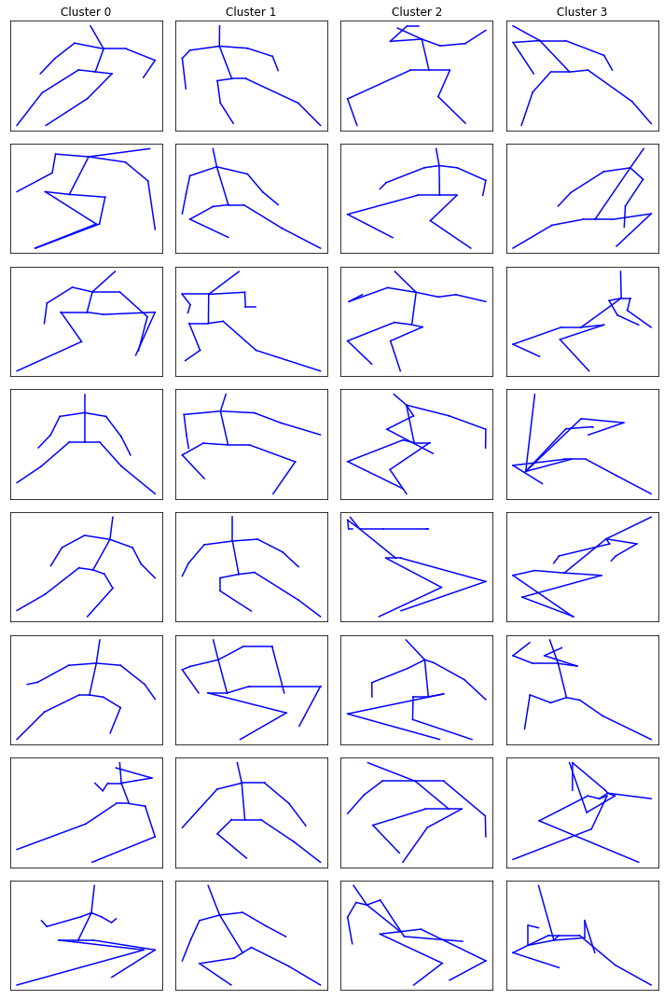

In [71]:
showClusterExamples(kmeans_features.labels_, clean_poses, n_examples, k_feat, save='kmeans_feat_2d_examples')

In [37]:
def showClusterExamplesImg(model_labels, poses, n_examples, k):
    path = '../PenaltyData/prem_19_20_20_21/'
    pose_ids = np.zeros((n_examples, k))
    fig, ax = plt.subplots(nrows=n_examples, ncols=k)
    for i in range(k):
        image_ids = np.where(model_labels == i)[0]
        image_ids = image_ids[image_ids < 217]
        pose_ids[:, i] = np.random.choice(image_ids, n_examples, replace=False)
    for i in range(n_examples):
        for j in range(k):
            img = importImage(path + 'f' + str(int(pose_ids[i, j])) + '.png')
            ax[i,j].imshow(img)
            #for keypoint in range(len(pose_3d)):
                #ax[i,j].scatter(pose_3d[keypoint][:2][0], -pose_3d[keypoint][:2][1], c='b')
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
    plt.tight_layout()
    plt.show()

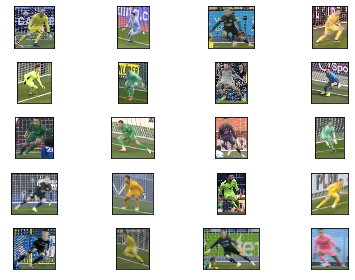

In [38]:
showClusterExamplesImg(kmeans_raw.labels_, pose_arr, n_examples, k)

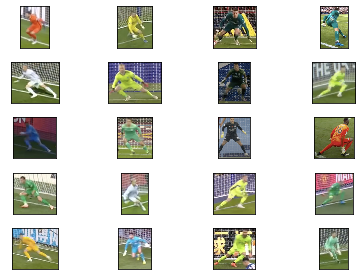

In [39]:
showClusterExamplesImg(kmeans_clean.labels_, clean_poses, n_examples, k)

<IPython.core.display.Javascript object>


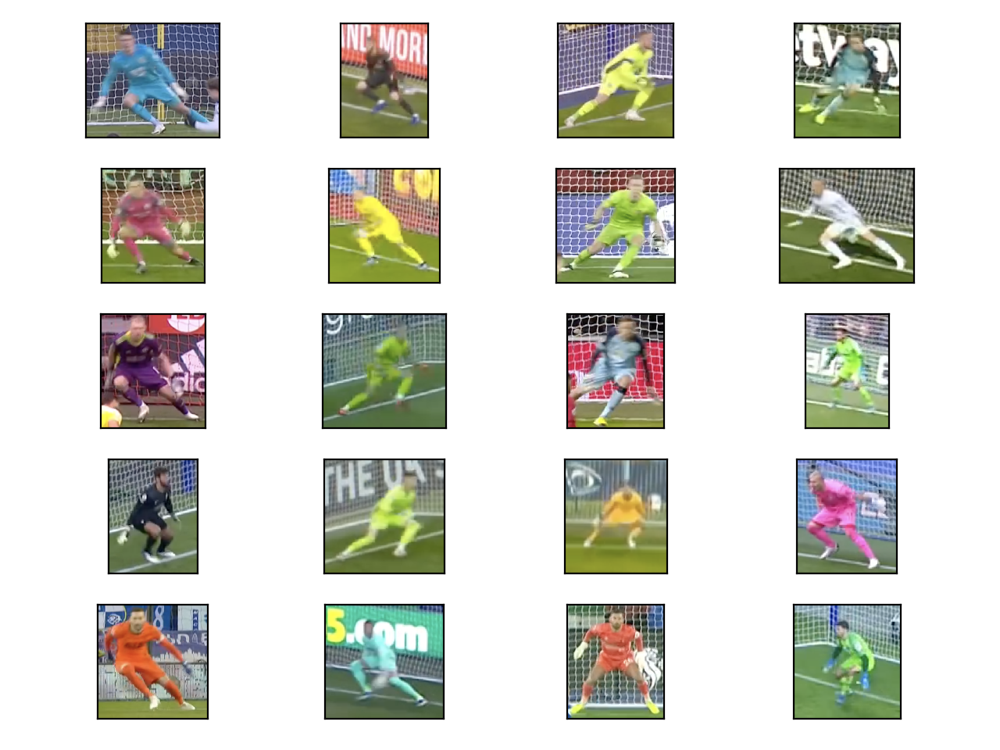

In [185]:
showClusterExamplesImg(kmeans_features.labels_, clean_poses, n_examples, k)

### Gaussian Mixture Model

In [41]:
#AIC and BIC to find optimal value of k for GMM
aic = []
bic = []
for k in range(2, 11):
    gmm = GaussianMixture(n_components=k, n_init=1)
    gmm.fit(poses_features)
    aic.append(gmm.aic(poses_features))
    bic.append(gmm.bic(poses_features))

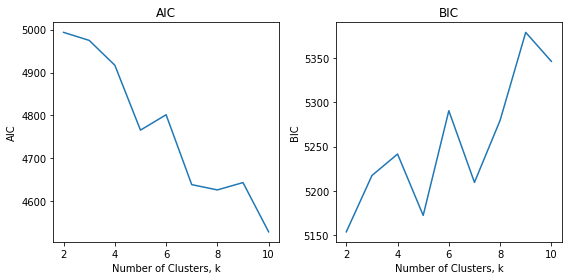

In [42]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
ax[0].plot(list(range(2, 11)), aic)
ax[0].set_title('AIC')
ax[0].set_xlabel('Number of Clusters, k')
ax[0].set_ylabel('AIC')
ax[1].plot(list(range(2, 11)), bic)
ax[1].set_title('BIC')
ax[1].set_xlabel('Number of Clusters, k')
ax[1].set_ylabel('BIC')
plt.tight_layout()
plt.show()

In [44]:
k=4
gmm_raw = getGMM(pose_arr, k)

In [45]:
gmm_clean = getGMM(clean_poses, k)

In [46]:
gmm_features = getGMM(poses_features, k)

In [47]:
np.where(gmm_features == 1)

(array([  4,  79, 118, 129]),)

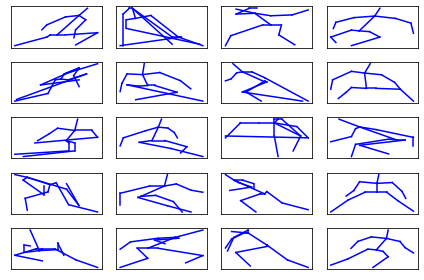

In [48]:
showClusterExamples(gmm_raw, pose_arr, n_examples=5, k=k)

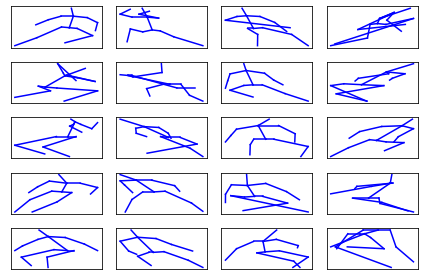

In [49]:
showClusterExamples(gmm_clean, clean_poses, n_examples=5, k=k)

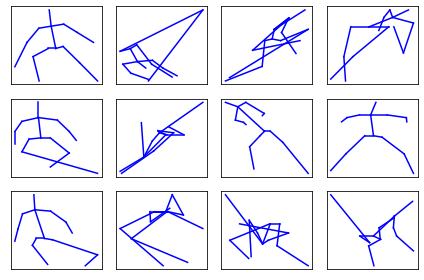

In [57]:
showClusterExamples(gmm_features, clean_poses, n_examples=3, k=k)

<IPython.core.display.Javascript object>


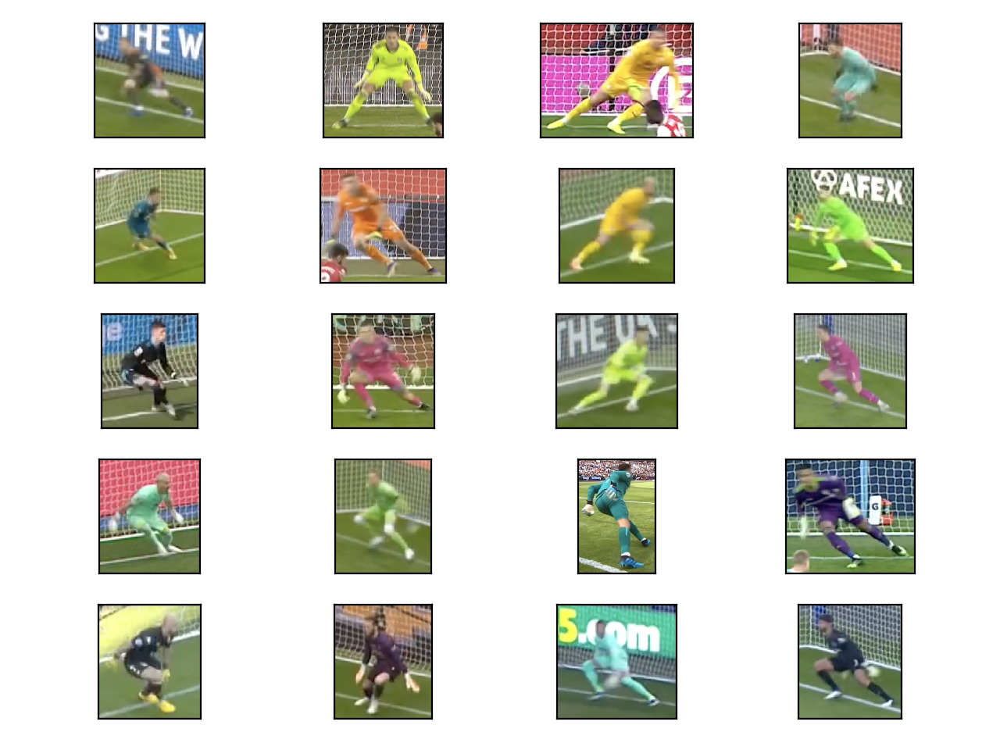

In [198]:
showClusterExamplesImg(gmm_raw, pose_arr, n_examples=5, k=k)

<IPython.core.display.Javascript object>


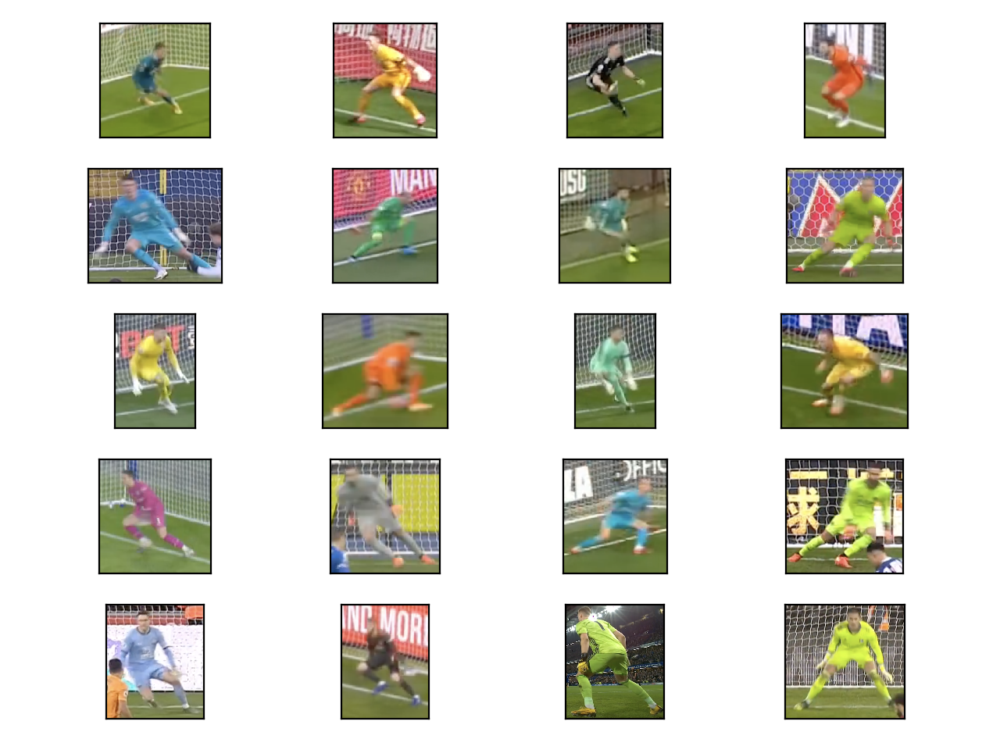

In [199]:
showClusterExamplesImg(gmm_clean, clean_poses, n_examples=5, k=k)

<IPython.core.display.Javascript object>


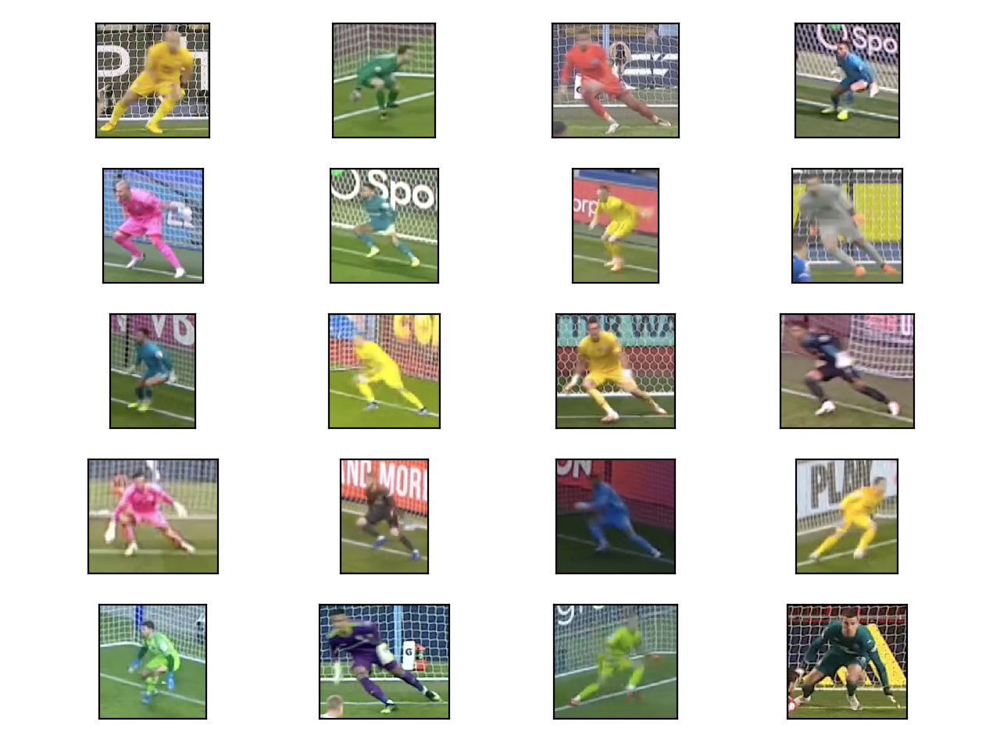

In [208]:
showClusterExamplesImg(gmm_features, clean_poses, n_examples=5, k=k)

<IPython.core.display.Javascript object>


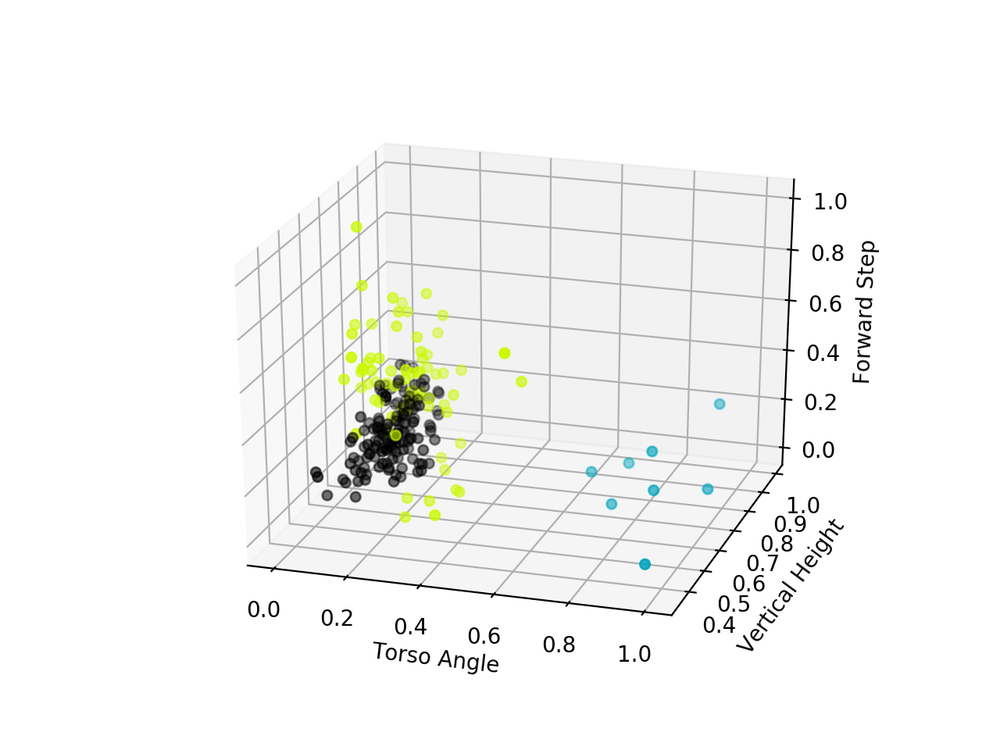

In [68]:
#Plot the 3d feature space
colors_gmm = cm.nipy_spectral(clusters_gmm.astype(float) / k)
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter(poses_features[:, 0], poses_features[:, 1], poses_features[:, 2], c=colors_gmm)
ax.set_xlabel('Torso Angle')
ax.set_ylabel('Vertical Height')
ax.set_zlabel('Forward Step')
plt.show()

### Mean Shift Clustering
Does not produce good clusters. Most instances belong to the same class. Produces 4 classes, but only very few in all but one of them

In [23]:
from sklearn.cluster import MeanShift

In [53]:
mean_shift = MeanShift().fit_predict(pose_arr)

In [54]:
mean_shift

array([0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

### Hierarchical Clustering

In [69]:
from sklearn.cluster import AgglomerativeClustering
k=5
hier = AgglomerativeClustering(n_clusters = k, affinity='euclidean', linkage='ward').fit_predict(pose_arr)

In [70]:
np.where(hier == 1)

(array([  1,   7,   9,  12,  15,  19,  20,  24,  25,  28,  29,  37,  40,
         41,  44,  52,  53,  58,  62,  63,  74,  75,  77,  80,  82,  88,
         89,  93,  94,  95, 100, 101, 102, 106, 109, 110, 111, 112, 113,
        115, 120, 124, 128, 133, 135, 140, 141, 146, 148, 150, 153, 168,
        169, 175, 180, 184, 185, 191, 196, 197, 199, 201, 204, 207, 212]),)

### DBSCAN

In [72]:
from sklearn.cluster import DBSCAN

In [91]:
dbscan = DBSCAN(eps=8, min_samples=2).fit_predict(pose_arr)

In [92]:
dbscan

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

## Dimensionality Reduction / Manifold Learning
### t-Stochastic Neighbourhood Embedding

In [26]:
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

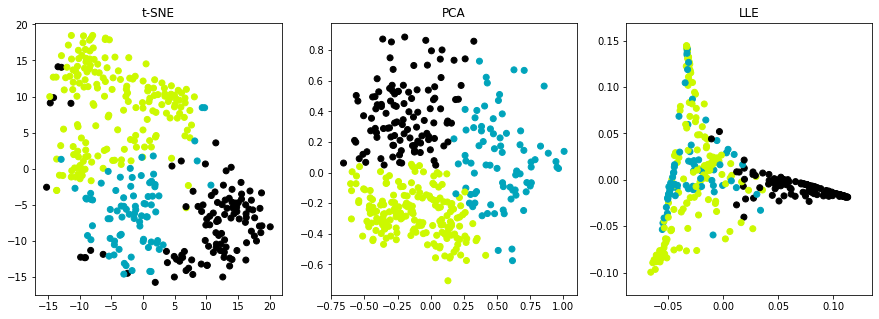

In [37]:
#K-means raw dataset
plotManifold(pose_arr, kmeans_raw.labels_, k_raw, save='kmeans_raw_3')

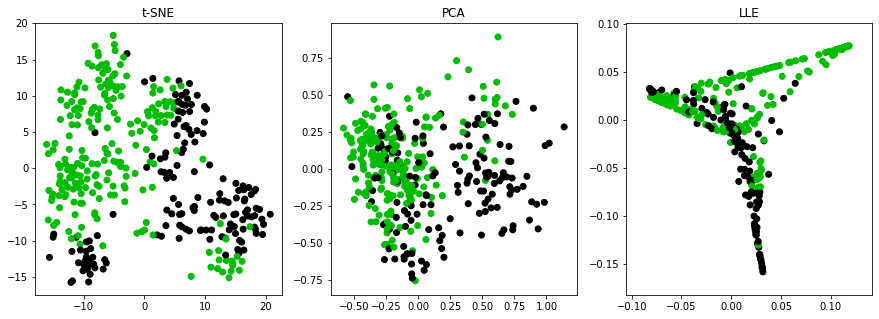

In [38]:
#K-means camera-view invariant dataset
plotManifold(clean_poses, kmeans_clean.labels_, k_cvi, save='kmeans_cvi_2')

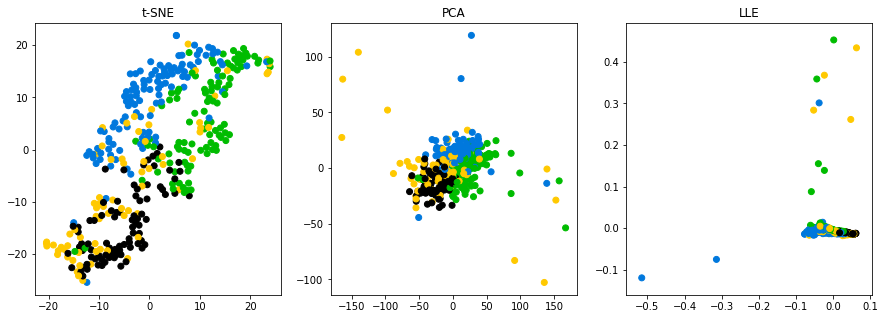

In [39]:
#K-means features dataset
plotManifold(poses_features, kmeans_features.labels_, k_feat, save='kmeans_feat_4')

In [53]:
def plotTSNE(tsne_embedded, kmeans, gmm, k):
    #Plot 2D t-SNE plot, colors indicate clusters
    colors_gmm = cm.nipy_spectral(gmm.astype(float) / k)
    colors_kmeans = cm.nipy_spectral(kmeans.astype(float) / k)
    #colors_kmeans = cm.nipy_spectral(hier.astype(float) / 5)
    #colors_kmeans = cm.nipy_spectral(mean_shift.astype(float) / len(np.unique(mean_shift)))
    fig,ax = plt.subplots(nrows=1, ncols=2, figsize=(9, 4))
    ax[0].scatter(tsne_embedded[:,0], tsne_embedded[:,1], c=colors_kmeans)
    ax[0].set_title('K-Means')
    ax[1].scatter(tsne_embedded[:,0], tsne_embedded[:,1], c=colors_gmm)
    ax[1].set_title('Gaussian Mixture Model')
    plt.suptitle('t-SNE Embedding of 3D Body Pose')
    plt.show()

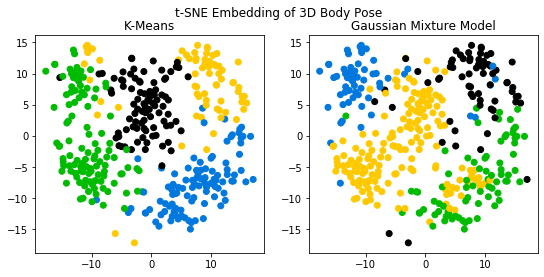

In [54]:
k=4
tsne_embedded = TSNE(n_components=2).fit_transform(pose_arr)
plotTSNE(tsne_embedded, kmeans_raw.labels_, gmm_raw, k=k)

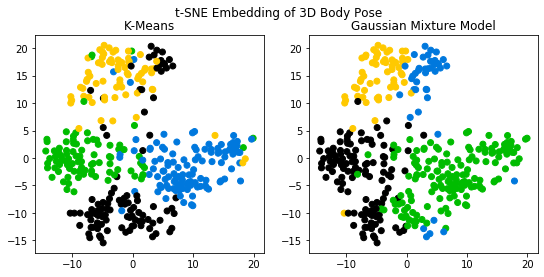

In [55]:
tsne_embedded = TSNE(n_components=2).fit_transform(clean_poses)
plotTSNE(tsne_embedded, kmeans_clean.labels_, gmm_clean, k=k)

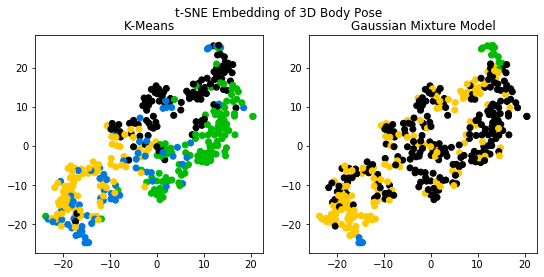

In [56]:
tsne_embedded = TSNE(n_components=2).fit_transform(poses_features)
plotTSNE(tsne_embedded, kmeans_features.labels_, gmm_features, k=k)

### Isomap

In [23]:
from sklearn.manifold import Isomap

In [24]:
isomap_embedding = Isomap(n_components=2, n_neighbors=10).fit_transform(pose_arr)

<IPython.core.display.Javascript object>


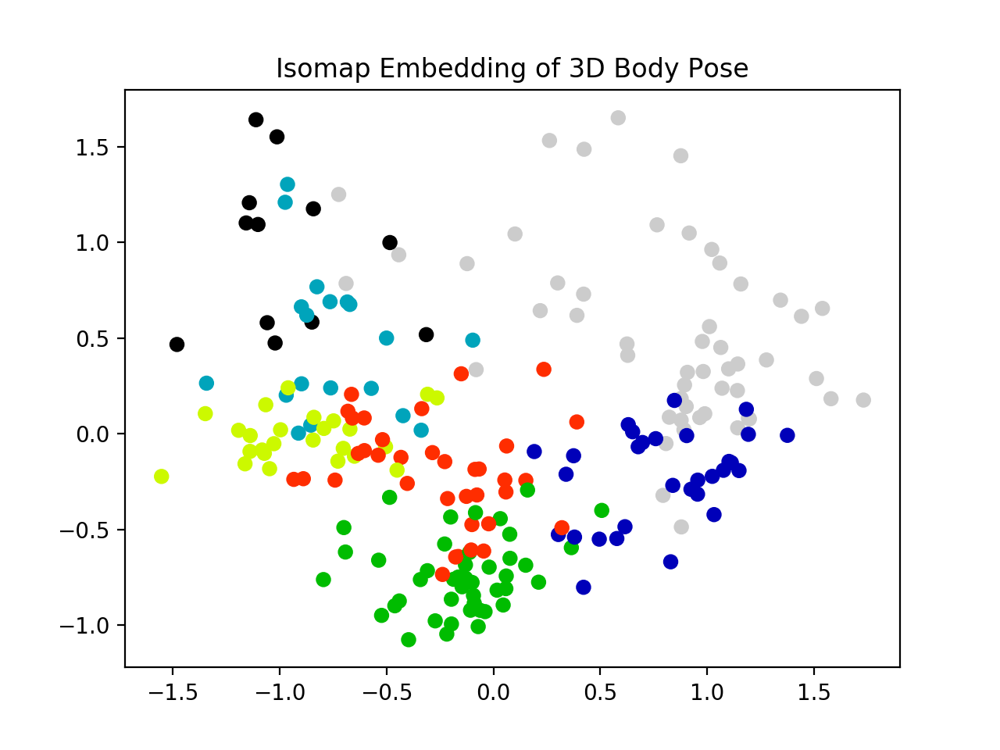

In [25]:
colors = cm.nipy_spectral(clusters.astype(float) / k)
plt.scatter(isomap_embedding[:,0], isomap_embedding[:,1], c=colors)
plt.title('Isomap Embedding of 3D Body Pose')
plt.show()

### Locally Linear Embedding

In [41]:
from sklearn.manifold import LocallyLinearEmbedding

In [48]:
lle_embedding = LocallyLinearEmbedding(n_components=2, n_neighbors=5).fit_transform(pose_arr)

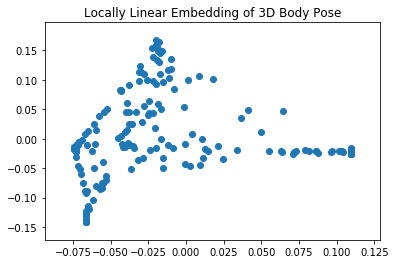

In [49]:
plt.scatter(lle_embedding[:,0], lle_embedding[:,1])
plt.title('Locally Linear Embedding of 3D Body Pose')
plt.show()

### Multi-dimensional Scaling

In [50]:
from sklearn.manifold import MDS

In [55]:
mds_embedding = MDS(n_components=2, metric=True).fit_transform(pose_arr)

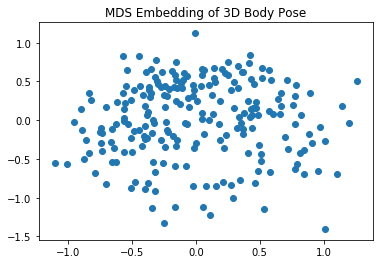

In [56]:
plt.scatter(mds_embedding[:,0], mds_embedding[:,1])
plt.title('MDS Embedding of 3D Body Pose')
plt.show()

### Principal Component Analysis

In [30]:
from sklearn.decomposition import PCA

In [87]:
pca = PCA(n_components=2).fit_transform(poses_features)

<IPython.core.display.Javascript object>


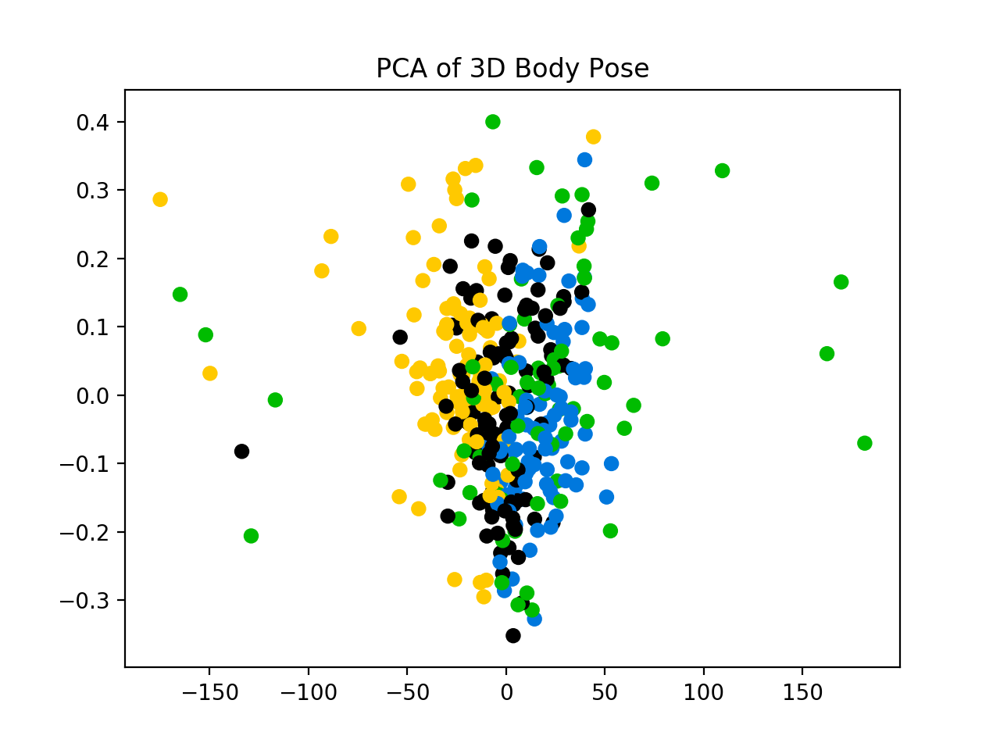

In [88]:
colors = cm.nipy_spectral(kmeans_features.labels_.astype(float) / k)
plt.scatter(pca[:,0], pca[:,1], c=colors)
plt.title('PCA of 3D Body Pose')
plt.show()

## Pose Matching Method
* Here, we induce our prior knowledge of penalty saving techniques by defining a set of anchor poses.
* For any poses in our wider dataset, the pose will be matched to the closest anchor pose in the anchor pose set. 'Closest' is defined by a similarity metric such as cosine similarity or Euclidean distance. 
* A good use of this method is for automatic technique labelling.

In [129]:
from scipy import spatial

In [83]:
#Human Body Pose Estimation Example - input image and 3D
def plotImg3D(im_id = 132):
    image = importImage('../PenaltyData/prem_19_20_20_21/f' + str(im_id) + '.png')
    points = pose_to_matrix(clean_poses[im_id])

    fig = plt.figure(figsize=(10, 4))
    #fig.patch.set_visible(False)
    ax = fig.add_subplot(1, 2, 1)
    ax.imshow(image)
    ax.set_yticks([])
    ax.set_xticks([])
    ax.axis('off')
    ax.set_title('(a) Input Image', y=-0.14)

    ax = fig.add_subplot(1, 2, 2, projection='3d')
    plot3D(ax, points)
    ax.set_title('(b) 3D Pose Estimation', y=-0.15)
    plt.tight_layout()
    #plt.savefig('viz/poseEstimationExample.png', dpi=500)
    plt.show()

In [134]:
#Reminder: Euclidean gives a DISTANCE, cosine give a SIMILARITY
def poseMatch(img_id, metric='euclidean'):
    for a in range(len(anchor_poses)):
        if metric == 'euclidean':
            dist = np.linalg.norm(clean_poses[img_id]-anchor_poses[a])
        elif metric == 'cosine':
            dist = 1 - spatial.distance.cosine(clean_poses[img_id], anchor_poses[a])
        print(anchor_names[a] + ': ' + str(dist))

In [96]:
anchor_names = ['Upright', 'Dive Left', 'Dive Right']
anchor_ids = [132, 104, 69]
anchor_poses = clean_poses[anchor_ids]

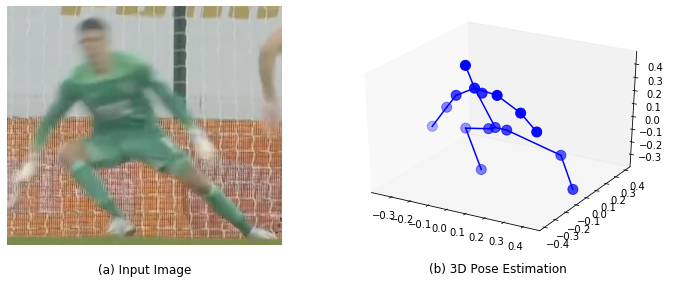

In [138]:
plotImg3D(im_id = 114)

In [139]:
poseMatch(img_id = 114, metric='euclidean')
poseMatch(img_id = 114, metric='cosine')

Upright: 0.5762036278726258
Dive Left: 0.9921016657736704
Dive Right: 0.465597496178427
Upright: 0.8975449655070101
Dive Left: 0.6595876578959106
Dive Right: 0.9300894610506014


## Expected Penalty Save Model - Classification

In [44]:
#Fill NA's with 0 in off_target column
pose_3d_df['off_target'].fillna(0, inplace=True)
#Add cluster assignments to DF
pose_3d_df['clusters'] = clusters_kmeans
#Remove penalties that were off target
pose_3d_df = pose_3d_df[pose_3d_df['off_target'] == 0].copy()
#Keep the index so can keep track of what photo refers to what observation and reset index
pose_3d_df.reset_index(level=0, inplace=True)

In [58]:
pose_3d_df.head()

,index,goalkeepers,url,pen_taker,outcome,off_target,0,1,2,3,...,39,40,41,42,43,44,45,46,47,clusters
0,0,Łukasz Fabiański,/en/matches/71c8a43e/West-Ham-United-Mancheste...,Sergio Agüero,Scored,0.0,0.156250,0.500000,-0.121990,0.125000,...,0.031250,-0.171875,0.071426,-0.140625,-0.078125,0.095242,-0.171875,0.06250,0.078947,5
1,1,Kepa Arrizabalaga,/en/matches/d0583d0d/Manchester-United-Chelsea...,Marcus Rashford,Scored,0.0,-0.062500,0.250000,-0.019149,-0.171875,...,-0.156250,-0.187500,-0.079030,-0.078125,-0.140625,-0.132560,-0.078125,-0.06250,-0.082005,1
2,2,Tom Heaton,/en/matches/7ad0ed82/Aston-Villa-Bournemouth-A...,Joshua King,Scored,0.0,-0.312500,0.296875,0.020156,-0.125000,...,0.171875,-0.125000,0.053451,0.171875,-0.031250,0.088715,0.265625,0.03125,0.073190,4
3,3,Rui Patrício,/en/matches/d8a7f871/Wolverhampton-Wanderers-M...,Paul Pogba,Missed,0.0,0.359375,0.281250,0.114260,0.250000,...,0.296875,-0.187500,0.027412,0.312500,-0.109375,0.123128,0.296875,-0.06250,0.127119,5
4,5,Ben Foster,/en/matches/89fbf2a3/Watford-West-Ham-United-A...,Mark Noble,Scored,0.0,-0.203125,0.250000,0.038489,-0.203125,...,-0.031250,-0.015625,-0.109567,-0.062500,0.046875,-0.013181,-0.125000,0.09375,0.004897,2


In [50]:
#15.5% of penalties that are on target were saved
np.mean(y)

0.1553398058252427

In [55]:
#Create target and predictive variables
y = np.array((pose_3d_df['outcome'] == 'Missed').astype(int))
X = pd.get_dummies(pose_3d_df['clusters']).values

### Logistic Regression - Statsmodels

In [59]:
import statsmodels.api as sm
log_reg = sm.Logit(y, X).fit()
log_reg.summary()

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


         Current function value: 0.422164
         Iterations: 35


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  206
Model:                          Logit   Df Residuals:                      200
Method:                           MLE   Df Model:                            5
Date:                Tue, 29 Jun 2021   Pseudo R-squ.:                 0.02245
Time:                        13:13:11   Log-Likelihood:                -86.966
converged:                      False   LL-Null:                       -88.963
Covariance Type:            nonrobust   LLR p-value:                    0.5501
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -1.7579      0.484     -3.630      0.000      -2.707      -0.809
x2            -1.5686      0.348     -4.513      0.000      -2.250      -0.887
x3           -23.5747   4.16e+04     -0.001      1.000   -8.16e+04    8.15e+04
x4            -1.7707      0.382     -4.630      0.000      -2.520      -1.021
x5            -1.6094      0.490     -3.285      0.001      -2.570      -0.649
x6            -1.3218      0.563     -2.349      0.019      -2.425      -0.219
==============================================================================
"""

In [76]:
from sklearn.linear_model import LogisticRegression

In [77]:
lr = LogisticRegression(random_state=0).fit(X, y)

In [78]:
lr.predict_proba(np.array([[1,0,0,0,0,0],
                            [0,1,0,0,0,0],
                            [0,0,1,0,0,0],
                            [0,0,0,1,0,0],
                            [0,0,0,0,1,0],
                            [0,0,0,0,0,1]]))

array([[0.85370783, 0.14629217],
       [0.83098994, 0.16901006],
       [0.92612664, 0.07387336],
       [0.85485104, 0.14514896],
       [0.83817803, 0.16182197],
       [0.80804259, 0.19195741]])

In [80]:
np.where(clusters_kmeans == 5)

(array([  0,   3,   6,   8,  28,  30,  83,  92,  97, 108, 109, 122, 161,
        165, 166, 167, 172, 180, 193, 203]),)

### SVM

In [65]:
from sklearn.svm import SVC

In [71]:
svm = SVC(probability=True).fit(X, y)

In [75]:
svm.predict_proba(np.array([[1,0,0,0,0,0],
                            [0,1,0,0,0,0],
                            [0,0,1,0,0,0],
                            [0,0,0,1,0,0],
                            [0,0,0,0,1,0],
                            [0,0,0,0,0,1]]))

array([[0.84442946, 0.15557054],
       [0.84442946, 0.15557054],
       [0.84442946, 0.15557054],
       [0.84442946, 0.15557054],
       [0.84442946, 0.15557054],
       [0.84442946, 0.15557054]])